<a href="https://colab.research.google.com/github/rutvikvijjali/vae-gan-face-generator/blob/master/VAE_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!wget https://cswww.essex.ac.uk/mv/allfaces/faces94.zip

--2019-04-15 14:16:03--  https://cswww.essex.ac.uk/mv/allfaces/faces94.zip
Resolving cswww.essex.ac.uk (cswww.essex.ac.uk)... 155.245.92.179
Connecting to cswww.essex.ac.uk (cswww.essex.ac.uk)|155.245.92.179|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18845407 (18M) [application/zip]
Saving to: ‘faces94.zip.1’

faces94.zip.1       100%[===================>]  17.97M  3.62MB/s    in 5.2s    

2019-04-15 14:16:09 (3.45 MB/s) - ‘faces94.zip.1’ saved [18845407/18845407]



In [0]:
!unzip faces94.zip

Archive:  faces94.zip
replace faces94/female/9336923/9336923.1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.10.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.11.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.12.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.13.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.14.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.15.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.16.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.17.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.18.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female/9336923/9336923.19.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace faces94/female

In [0]:
import os
from PIL import Image
import numpy as np
%matplotlib inline

In [0]:
def load_images(path,width=128,height=128):
  count = 0
  images = []
  valid_ext = ["jpg","gif","png","tga"]
  for root, dirnames, filenames in os.walk(path):
        for filename in filenames:
            file = os.path.join(root, filename)
            ext = str(file.split(".")[-1])
            if ext in valid_ext:
              image = Image.open(file)
#               print(len(np.shape(np.array(image)))
              if(len(np.shape(np.array(image))) == 3):
                image_r = image.resize((width, height), Image.ANTIALIAS)    # best down-sizing filter
                if (count>10000):
                  break
                images.append(np.asarray(image_r))
                count+=1
                
  return images

In [0]:
images = load_images('faces94')

In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [0]:
import os
from PIL import Image
%matplotlib inline

In [0]:
len(images)

3058

In [0]:
def scale(x, feature_range=(0, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [0]:
scaled_images = []
for image in images:
  scaled_images.append(scale(np.array(image)))

In [0]:

  
def return_batches(batch_size,inputs):
  idx = np.arange(len(inputs))
  np.random.shuffle(idx)
  inputs = [inputs[i] for i in idx]
  n_batches = len(inputs) 
  
  for i in range(0, n_batches, batch_size):
    x = inputs[i:i+batch_size]

    
    yield x


In [0]:
import tensorflow as tf

In [0]:
class GAN():
  
  
  
  
  def encoder(self,img,reuse=False):
    
    with tf.variable_scope("generator_enc", reuse = reuse):

      x = tf.layers.Conv2D(filters = 128, strides = 2, kernel_size = 3, padding = 'same', activation=tf.nn.relu)(img)
      x = tf.layers.batch_normalization(x, training=True)
  #     x = tf.layers.MaxPooling2D(pool_size = 2, strides = 2, padding = 'same')(x)



      x = tf.layers.Conv2D(filters = 64, strides = 2, kernel_size = 3, padding = 'same',activation=tf.nn.relu)(x)
      x = tf.layers.batch_normalization(x, training=True)
  #     x = tf.layers.MaxPooling2D(pool_size = 2, strides = 2, padding = 'same')(x)


      x = tf.layers.Conv2D(filters = 32, strides = 2, kernel_size = 3, padding = 'same', activation=tf.nn.relu)(x)
      x = tf.layers.batch_normalization(x, training=True)
  #     x = tf.layers.MaxPooling2D(pool_size = 2, strides = 2, padding = 'same')(x)

      x = tf.layers.Conv2D(filters = 16, strides = 2, kernel_size = 3, padding = 'same', activation=tf.nn.relu)(x)
      x = tf.layers.batch_normalization(x, training=True)
  #     x = tf.layers.MaxPooling2D(pool_size = 2, strides = 2, padding = 'same')(x)


      x = tf.reshape(x,(-1,8*8*16))
  #     out = tf.layers.Dense(100)(x)


      log_var = tf.layers.Dense(50,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      log_var = tf.layers.batch_normalization(log_var, training=True)
      mean = tf.layers.Dense(50,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      mean = tf.layers.batch_normalization(mean, training=True)


      latent_vec = self.sampler(mean,log_var)
      return mean,log_var,latent_vec
  
  
  def sampler(self, mean, log_stddev):
    # we sample from the standard normal a matrix of batch_size * latent_size (taking into account minibatches)
    std_norm = tf.random_normal(shape=(tf.shape(mean)[0], 50), mean=0, stddev=1)
    # sampling from Z~N(μ, σ^2) is the same as sampling from μ + σX, X~N(0,1)
    return mean + tf.exp(log_stddev) * std_norm
  
  
  def decoder(self,latent_vector, reuse = False):
    with tf.variable_scope("generator_dec", reuse = reuse):
    
      x = tf.layers.Dense(8*8*16)(latent_vector)
      x = tf.reshape(x,(-1,8,8,16))

  #     x = tf.image.resize_nearest_neighbor(x,(8,8))
      # Now 8x8x16
      x = tf.layers.Conv2DTranspose(filters = 8,kernel_size = 3, strides = 2, padding='same',activation=tf.nn.relu,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      x = tf.layers.batch_normalization(x, training=True)
      # Now 16x16x8
  #     x = tf.image.resize_nearest_neighbor(x,(16,16))
      # Now 16x16x8
      x = tf.layers.Conv2DTranspose(16,3, strides = 2, padding='same',activation=tf.nn.relu,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      x = tf.layers.batch_normalization(x, training=True)
      # Now 32x32x16
  #     x = tf.image.resize_nearest_neighbor(x,(32,32))
      # Now 32x32x16
      x = tf.layers.Conv2DTranspose(32,3,strides = 2, padding='same',activation=tf.nn.relu,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      x = tf.layers.batch_normalization(x, training=True)
      # Now 64x64x32
  #     x = tf.image.resize_nearest_neighbor(x,(64,64))
      # Now 64x64x32
      x = tf.layers.Conv2DTranspose(64,3, strides = 2,padding='same',activation=tf.nn.relu,kernel_initializer=tf.contrib.layers.xavier_initializer())(x)
      x = tf.layers.batch_normalization(x, training=True)
      # Now 128x128x64
  #     x = tf.image.resize_nearest_neighbor(x,(128,128))
      # Now 128x128x64
      logits = tf.layers.Conv2DTranspose(3,3,padding='same',activation=None)(x)
      # Now 128x128x3

      decoded = tf.nn.sigmoid(logits,name='decoded')

    return logits, decoded
    
  
  def discriminator(self,x,alpha = 0.2, training = True, reuse = False):
    with tf.variable_scope("discriminator", reuse=reuse):
        # Input is 128x128x3
        x1 = tf.layers.Conv2D(64, 5, strides=2, padding="same")(x)
#         x1 = tf.keras.layers.Conv2D(filters = 64, kernel_size=5, strides=2,padding = 'SAME')(x)
        x1 = tf.nn.leaky_relu(x1,alpha = alpha)
        # 64x64x64
        x2 = tf.layers.Conv2D(128, 5, strides=2, padding="same")(x1)
#         x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.nn.leaky_relu(x2,alpha = alpha)
        # 32x32x128
        
        x3 = tf.layers.Conv2D(256, 5, strides=2, padding="same")(x2)
#         x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding="same")
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.nn.leaky_relu(x3,alpha = alpha)
        # 16x16x256

        # Flatten
        flat = tf.reshape(x3, (-1, 16*16*256))
        logits = tf.layers.Dense(1)(flat)
        out = tf.sigmoid(logits)

        return logits, out

      
  
  
  
  def model_optimizers(self,learning_rate,beta1):
    
    t_vars = tf.trainable_variables()
    
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate = 0.0002, beta1=beta1).minimize(self.disc_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate = 0.0003, beta1=beta1).minimize(self.gen_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt
    
  def build_model(self):
    
    self.real_imgs = tf.placeholder(shape=(None,128,128,3),dtype = tf.float32, name = 'REAL_IMGS')
    self.disc_real_logits,self.disc_real_outs = self.discriminator(self.real_imgs)
    
    self.mean, self.std_dev, self.latent_vec = self.encoder(self.real_imgs)
    self.kl_loss = - 0.5 * tf.keras.backend.sum(1 + self.std_dev - tf.square(self.mean) - tf.square(tf.exp(self.std_dev)), axis=-1)
    
    self.generated_logits, self.generated_imgs = self.decoder(self.latent_vec)
    
    self.disc_fake_logits,self.disc_fake_outs = self.discriminator(self.generated_imgs,reuse = True)
    
    self.noise_vec = tf.placeholder(shape = (None,128,128,3), dtype = tf.float32, name = 'NOISE')
    self.noise_logits, self.noise_outs = self.discriminator(self.noise_vec, reuse = True)
    
    disc_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = self.disc_real_logits, labels = tf.ones_like(self.disc_real_outs)*0.9))
    
    disc_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = self.disc_fake_logits, labels = tf.zeros_like(self.disc_fake_outs)))
    
#     disc_loss_noise = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = self.noise_logits, labels = tf.zeros_like(self.noise_outs)))
    
    self.disc_loss =  disc_loss_real + disc_loss_fake 
    
    self.gen_loss = tf.reduce_mean(tf.square(self.disc_fake_outs-self.disc_real_outs)+0.001*self.kl_loss)
    
    
    self.disc_opt, self.gen_opt = self.model_optimizers(learning_rate = 0.0001, beta1 = 0.5)
    
    
    
  def __init__(self):
    self.build_model()
    
    
 

  

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5, 5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols,
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min()) * 255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')

    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [0]:
from matplotlib.pyplot import imshow

In [0]:
def train(net1, dataset, epochs, batch_size, print_every=10, show_every=200, figsize=(10, 5)):
  
  
  saver = tf.train.Saver()
  sample_z = dataset[0:16]

  samples, losses = [], []
  steps = 0

  with tf.Session() as sess:
    
#     sess.run(tf.global_variables_initializer())
    try:
      saver.restore(sess, './ckpts/generator.ckpt')
      print('Restoring...')
      
    except : 
      print("No saved file found")
      sess.run(tf.global_variables_initializer())
      
      
    for e in range(epochs):

      for x in return_batches(batch_size,dataset):


        steps += 1

        # Sample random noise for G
        batch_z = np.random.normal(0, 0.816496580927726, size=(batch_size, *img_size))

        # Run optimizers

        _ = sess.run(net1.disc_opt, feed_dict={net1.real_imgs: x, net1.noise_vec: batch_z})
        _ = sess.run(net1.gen_opt, feed_dict={net1.real_imgs: x, net1.noise_vec: batch_z})

        if steps % print_every == 0:
            # At the end of each epoch, get the losses and print them out
            train_loss_d = net1.disc_loss.eval({net1.noise_vec: batch_z, net1.real_imgs: x})
            train_loss_g = net1.gen_loss.eval({net1.real_imgs: x, net1.noise_vec: batch_z})

            print("Epoch {}/{}...".format(e + 1, epochs),
                  "Discriminator Loss: {:.4f}...".format(train_loss_d),
                  "Generator Loss: {:.4f}".format(train_loss_g))
            # Save losses to view after training
            losses.append((train_loss_d, train_loss_g))


            if steps % show_every == 0:

              w=10
              h=10
              fig=plt.figure(figsize=(8, 8))
              columns = 4
              rows = 5
              j = 1
              gen_samples = sess.run(net1.generated_imgs,feed_dict={net1.real_imgs: x})
              for i in range(1, min(int(columns*rows/2)+1,len(x))):
                  img = gen_samples[i]
                  real_img = x[i]
                  fig.add_subplot(rows, columns, j)
                  plt.imshow(img)
                  fig.add_subplot(rows, columns, j+1)
                  j+=2
                  plt.imshow(real_img)
              plt.show()
              samples.append(gen_samples[-1])
      print('SAVING Checkpoint..')
      saver.save(sess, './ckpts/generator.ckpt')

#     with open('samples.pkl', 'wb') as f:
#         pickle.dump(samples, f)

  return losses, samples

INFO:tensorflow:Restoring parameters from ./ckpts/generator.ckpt
Restoring...
Epoch 1/50... Discriminator Loss: 0.3756... Generator Loss: 0.6976
Epoch 1/50... Discriminator Loss: 0.3510... Generator Loss: 0.8643
Epoch 1/50... Discriminator Loss: 0.3699... Generator Loss: 0.7662
Epoch 1/50... Discriminator Loss: 0.3494... Generator Loss: 0.7722
Epoch 1/50... Discriminator Loss: 0.3424... Generator Loss: 0.7783
Epoch 1/50... Discriminator Loss: 0.3447... Generator Loss: 0.8565
Epoch 1/50... Discriminator Loss: 3.8535... Generator Loss: 0.4121
Epoch 1/50... Discriminator Loss: 1.0456... Generator Loss: 0.4137
Epoch 1/50... Discriminator Loss: 1.2565... Generator Loss: 0.6894
Epoch 1/50... Discriminator Loss: 1.3581... Generator Loss: 0.5941
Epoch 1/50... Discriminator Loss: 0.3920... Generator Loss: 0.8760
Epoch 1/50... Discriminator Loss: 0.3976... Generator Loss: 0.9524
Epoch 1/50... Discriminator Loss: 0.3760... Generator Loss: 0.7994
Epoch 1/50... Discriminator Loss: 0.3561... Generat

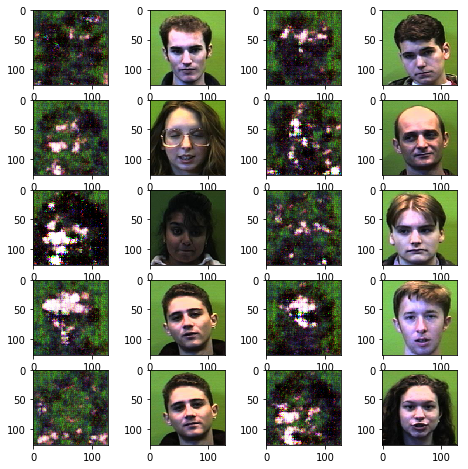

Epoch 2/50... Discriminator Loss: 0.3593... Generator Loss: 0.9336
Epoch 2/50... Discriminator Loss: 0.3640... Generator Loss: 0.8542
Epoch 2/50... Discriminator Loss: 0.3333... Generator Loss: 0.8587
Epoch 2/50... Discriminator Loss: 0.3688... Generator Loss: 0.9181
Epoch 2/50... Discriminator Loss: 0.3805... Generator Loss: 0.8902
Epoch 2/50... Discriminator Loss: 0.4137... Generator Loss: 0.8495
Epoch 2/50... Discriminator Loss: 0.3686... Generator Loss: 0.7243
Epoch 2/50... Discriminator Loss: 0.4617... Generator Loss: 0.9489
Epoch 2/50... Discriminator Loss: 0.3705... Generator Loss: 0.9150
Epoch 2/50... Discriminator Loss: 0.4551... Generator Loss: 0.5401
Epoch 2/50... Discriminator Loss: 0.3429... Generator Loss: 0.8917
Epoch 2/50... Discriminator Loss: 0.3546... Generator Loss: 0.7592
Epoch 2/50... Discriminator Loss: 0.3375... Generator Loss: 0.8255
Epoch 2/50... Discriminator Loss: 0.3941... Generator Loss: 0.6726
Epoch 2/50... Discriminator Loss: 0.3897... Generator Loss: 0.

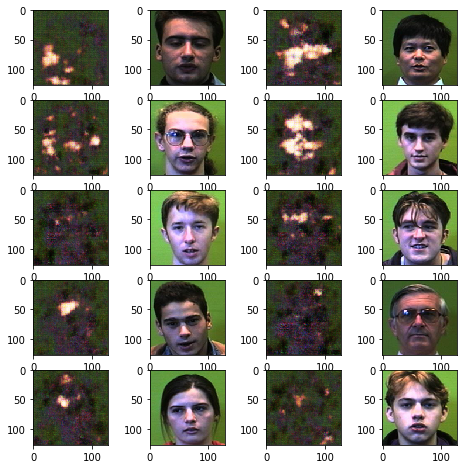

Epoch 3/50... Discriminator Loss: 0.3488... Generator Loss: 0.8746
Epoch 3/50... Discriminator Loss: 0.3628... Generator Loss: 0.8043
Epoch 3/50... Discriminator Loss: 0.3863... Generator Loss: 0.9501
Epoch 3/50... Discriminator Loss: 0.3975... Generator Loss: 0.9473
Epoch 3/50... Discriminator Loss: 0.3919... Generator Loss: 0.9428
Epoch 3/50... Discriminator Loss: 0.4414... Generator Loss: 0.9239
Epoch 3/50... Discriminator Loss: 0.3454... Generator Loss: 0.7660
Epoch 3/50... Discriminator Loss: 0.4516... Generator Loss: 0.8948
Epoch 3/50... Discriminator Loss: 0.3720... Generator Loss: 0.9404
Epoch 3/50... Discriminator Loss: 0.3768... Generator Loss: 0.8293
Epoch 3/50... Discriminator Loss: 0.3579... Generator Loss: 0.8848
Epoch 3/50... Discriminator Loss: 0.4027... Generator Loss: 0.7796
Epoch 3/50... Discriminator Loss: 0.3475... Generator Loss: 0.8202
Epoch 3/50... Discriminator Loss: 0.3728... Generator Loss: 0.8585
Epoch 3/50... Discriminator Loss: 0.4121... Generator Loss: 0.

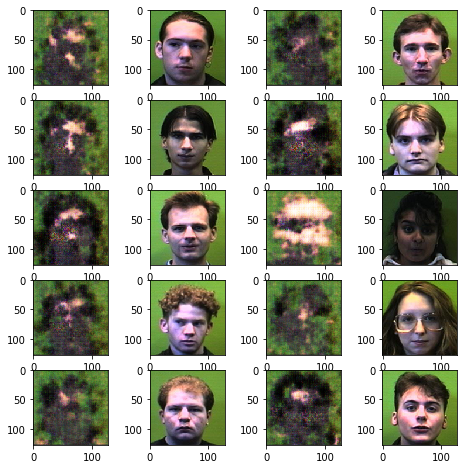

Epoch 4/50... Discriminator Loss: 0.3351... Generator Loss: 0.8288
Epoch 4/50... Discriminator Loss: 0.3949... Generator Loss: 0.9332
Epoch 4/50... Discriminator Loss: 0.4515... Generator Loss: 0.9066
Epoch 4/50... Discriminator Loss: 0.7003... Generator Loss: 0.9627
Epoch 4/50... Discriminator Loss: 0.4180... Generator Loss: 0.9575
Epoch 4/50... Discriminator Loss: 0.3392... Generator Loss: 0.8690
Epoch 4/50... Discriminator Loss: 0.3523... Generator Loss: 0.9170
Epoch 4/50... Discriminator Loss: 0.3923... Generator Loss: 0.9227
Epoch 4/50... Discriminator Loss: 0.3585... Generator Loss: 0.9232
Epoch 4/50... Discriminator Loss: 0.3545... Generator Loss: 0.8231
Epoch 4/50... Discriminator Loss: 0.3542... Generator Loss: 0.9306
Epoch 4/50... Discriminator Loss: 0.4552... Generator Loss: 0.8800
Epoch 4/50... Discriminator Loss: 0.3767... Generator Loss: 0.9425
Epoch 4/50... Discriminator Loss: 0.6681... Generator Loss: 0.9698
Epoch 4/50... Discriminator Loss: 0.3969... Generator Loss: 0.

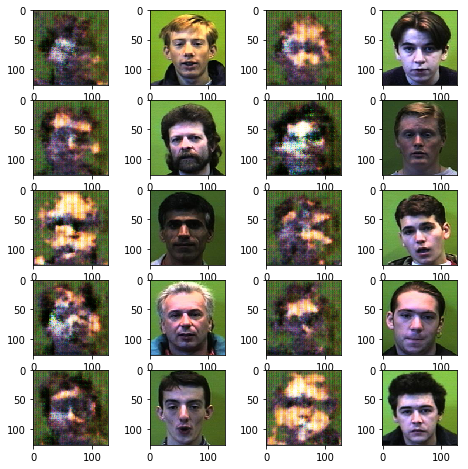

Epoch 5/50... Discriminator Loss: 0.3778... Generator Loss: 0.9286
Epoch 5/50... Discriminator Loss: 0.3480... Generator Loss: 0.8674
Epoch 5/50... Discriminator Loss: 0.3409... Generator Loss: 0.8531
Epoch 5/50... Discriminator Loss: 0.3606... Generator Loss: 0.7565
Epoch 5/50... Discriminator Loss: 0.3471... Generator Loss: 0.8302
Epoch 5/50... Discriminator Loss: 0.3491... Generator Loss: 0.7585
Epoch 5/50... Discriminator Loss: 0.4288... Generator Loss: 0.9517
Epoch 5/50... Discriminator Loss: 0.3550... Generator Loss: 0.8346
Epoch 5/50... Discriminator Loss: 0.3486... Generator Loss: 0.7674
Epoch 5/50... Discriminator Loss: 0.4266... Generator Loss: 0.6150
Epoch 5/50... Discriminator Loss: 0.6261... Generator Loss: 0.8260
Epoch 5/50... Discriminator Loss: 0.4725... Generator Loss: 0.5464
Epoch 5/50... Discriminator Loss: 0.4001... Generator Loss: 0.7200
Epoch 5/50... Discriminator Loss: 0.3884... Generator Loss: 0.6796
Epoch 5/50... Discriminator Loss: 0.3546... Generator Loss: 0.

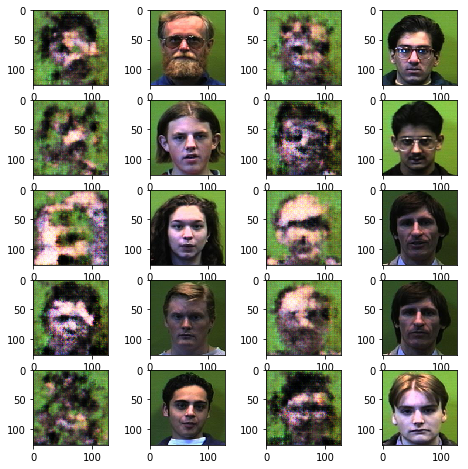

Epoch 6/50... Discriminator Loss: 0.3647... Generator Loss: 0.8016
Epoch 6/50... Discriminator Loss: 0.4701... Generator Loss: 0.9309
Epoch 6/50... Discriminator Loss: 0.3438... Generator Loss: 0.8709
Epoch 6/50... Discriminator Loss: 0.3625... Generator Loss: 0.8318
Epoch 6/50... Discriminator Loss: 0.3534... Generator Loss: 0.9067
Epoch 6/50... Discriminator Loss: 0.4178... Generator Loss: 0.9572
Epoch 6/50... Discriminator Loss: 0.3421... Generator Loss: 0.7699
Epoch 6/50... Discriminator Loss: 0.3416... Generator Loss: 0.7967
Epoch 6/50... Discriminator Loss: 0.3771... Generator Loss: 0.6815
Epoch 6/50... Discriminator Loss: 0.7187... Generator Loss: 0.8029
Epoch 6/50... Discriminator Loss: 0.4215... Generator Loss: 0.9505
Epoch 6/50... Discriminator Loss: 0.4243... Generator Loss: 0.9051
Epoch 6/50... Discriminator Loss: 0.3375... Generator Loss: 0.8432
Epoch 6/50... Discriminator Loss: 0.3647... Generator Loss: 0.8597
Epoch 6/50... Discriminator Loss: 0.3502... Generator Loss: 0.

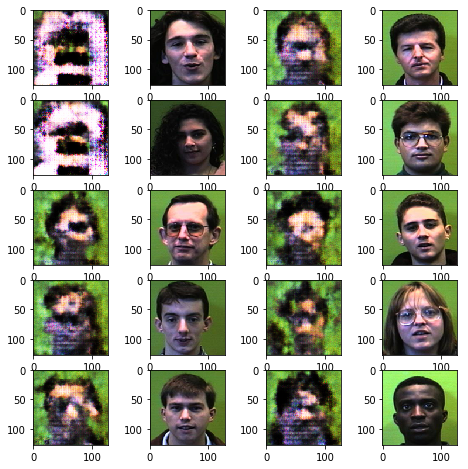

Epoch 7/50... Discriminator Loss: 0.4140... Generator Loss: 0.5915
Epoch 7/50... Discriminator Loss: 0.3630... Generator Loss: 0.8578
Epoch 7/50... Discriminator Loss: 0.3769... Generator Loss: 0.6993
Epoch 7/50... Discriminator Loss: 0.3407... Generator Loss: 0.8651
Epoch 7/50... Discriminator Loss: 0.5903... Generator Loss: 0.9031
Epoch 7/50... Discriminator Loss: 0.4038... Generator Loss: 0.8145
Epoch 7/50... Discriminator Loss: 0.3810... Generator Loss: 0.6732
Epoch 7/50... Discriminator Loss: 0.7602... Generator Loss: 0.6139
Epoch 7/50... Discriminator Loss: 0.5068... Generator Loss: 0.9040
Epoch 7/50... Discriminator Loss: 0.5675... Generator Loss: 0.9117
Epoch 7/50... Discriminator Loss: 0.4487... Generator Loss: 0.8162
Epoch 7/50... Discriminator Loss: 0.5163... Generator Loss: 0.5539
Epoch 7/50... Discriminator Loss: 0.3780... Generator Loss: 0.9145
Epoch 7/50... Discriminator Loss: 0.3739... Generator Loss: 0.8809
SAVING Checkpoint..
Epoch 8/50... Discriminator Loss: 0.5052..

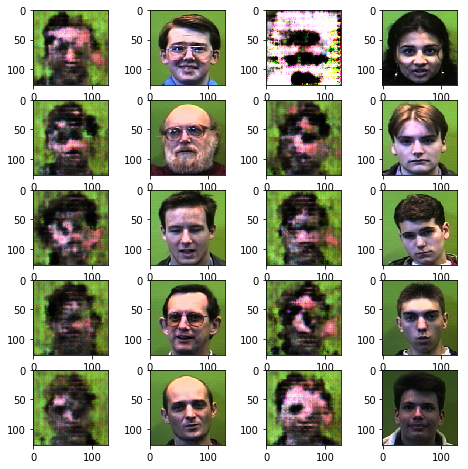

Epoch 8/50... Discriminator Loss: 0.3792... Generator Loss: 0.6713
Epoch 8/50... Discriminator Loss: 0.3849... Generator Loss: 0.7986
Epoch 8/50... Discriminator Loss: 0.3589... Generator Loss: 0.7508
Epoch 8/50... Discriminator Loss: 0.3820... Generator Loss: 0.8692
Epoch 8/50... Discriminator Loss: 0.3438... Generator Loss: 0.7876
Epoch 8/50... Discriminator Loss: 0.3430... Generator Loss: 0.8631
Epoch 8/50... Discriminator Loss: 0.3645... Generator Loss: 0.6862
Epoch 8/50... Discriminator Loss: 0.3385... Generator Loss: 0.8503
Epoch 8/50... Discriminator Loss: 0.3794... Generator Loss: 0.6492
Epoch 8/50... Discriminator Loss: 0.3484... Generator Loss: 0.8537
Epoch 8/50... Discriminator Loss: 0.3358... Generator Loss: 0.8095
Epoch 8/50... Discriminator Loss: 0.5337... Generator Loss: 0.9693
Epoch 8/50... Discriminator Loss: 0.3814... Generator Loss: 0.7884
SAVING Checkpoint..
Epoch 9/50... Discriminator Loss: 0.4350... Generator Loss: 0.9231
Epoch 9/50... Discriminator Loss: 0.3579..

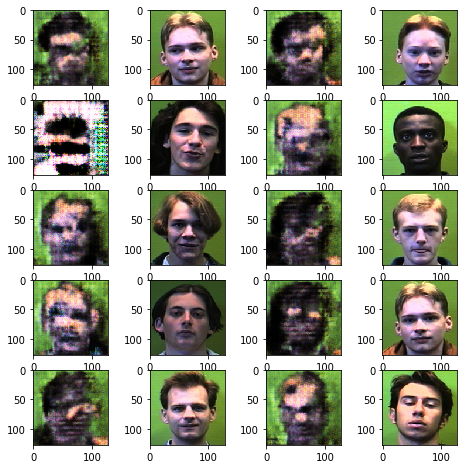

Epoch 9/50... Discriminator Loss: 0.3595... Generator Loss: 0.7462
Epoch 9/50... Discriminator Loss: 0.3750... Generator Loss: 0.8383
Epoch 9/50... Discriminator Loss: 0.6051... Generator Loss: 0.8782
Epoch 9/50... Discriminator Loss: 0.3537... Generator Loss: 0.8593
Epoch 9/50... Discriminator Loss: 0.4620... Generator Loss: 0.5300
Epoch 9/50... Discriminator Loss: 0.4017... Generator Loss: 0.9265
Epoch 9/50... Discriminator Loss: 0.4408... Generator Loss: 0.6506
Epoch 9/50... Discriminator Loss: 0.3788... Generator Loss: 0.6657
Epoch 9/50... Discriminator Loss: 0.3666... Generator Loss: 0.8877
Epoch 9/50... Discriminator Loss: 0.4487... Generator Loss: 0.9091
Epoch 9/50... Discriminator Loss: 0.3677... Generator Loss: 0.7054
Epoch 9/50... Discriminator Loss: 0.3495... Generator Loss: 0.7779
SAVING Checkpoint..
Epoch 10/50... Discriminator Loss: 0.3562... Generator Loss: 0.8935
Epoch 10/50... Discriminator Loss: 0.3448... Generator Loss: 0.8037
Epoch 10/50... Discriminator Loss: 0.357

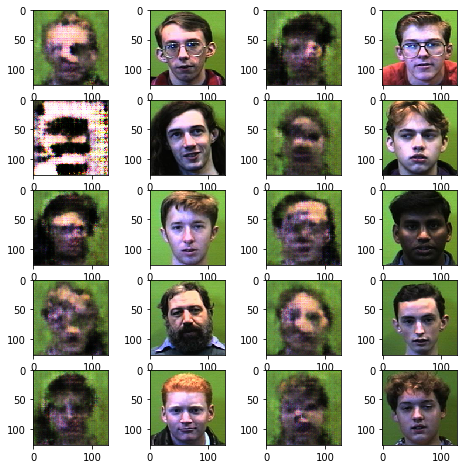

Epoch 10/50... Discriminator Loss: 0.3422... Generator Loss: 0.7700
Epoch 10/50... Discriminator Loss: 0.3599... Generator Loss: 0.8406
Epoch 10/50... Discriminator Loss: 0.3442... Generator Loss: 0.8911
Epoch 10/50... Discriminator Loss: 0.3900... Generator Loss: 0.9296
Epoch 10/50... Discriminator Loss: 0.3699... Generator Loss: 0.6712
Epoch 10/50... Discriminator Loss: 0.3632... Generator Loss: 0.7728
Epoch 10/50... Discriminator Loss: 0.9798... Generator Loss: 0.2877
Epoch 10/50... Discriminator Loss: 0.4957... Generator Loss: 0.5519
Epoch 10/50... Discriminator Loss: 0.3955... Generator Loss: 0.7423
Epoch 10/50... Discriminator Loss: 0.4211... Generator Loss: 0.8719
Epoch 10/50... Discriminator Loss: 0.5205... Generator Loss: 0.5718
Epoch 10/50... Discriminator Loss: 1.0477... Generator Loss: 0.1373
SAVING Checkpoint..
Epoch 11/50... Discriminator Loss: 0.4156... Generator Loss: 0.8877
Epoch 11/50... Discriminator Loss: 0.3790... Generator Loss: 0.9124
Epoch 11/50... Discriminator

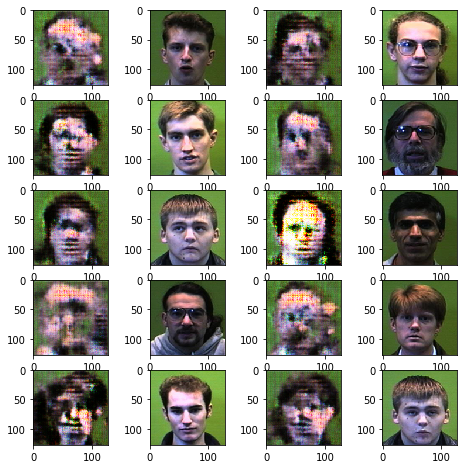

Epoch 11/50... Discriminator Loss: 0.7805... Generator Loss: 0.3629
Epoch 11/50... Discriminator Loss: 0.4490... Generator Loss: 0.8503
Epoch 11/50... Discriminator Loss: 0.3757... Generator Loss: 0.8845
Epoch 11/50... Discriminator Loss: 0.3829... Generator Loss: 0.9220
Epoch 11/50... Discriminator Loss: 0.4485... Generator Loss: 0.8827
Epoch 11/50... Discriminator Loss: 0.3525... Generator Loss: 0.8512
Epoch 11/50... Discriminator Loss: 0.3512... Generator Loss: 0.8543
Epoch 11/50... Discriminator Loss: 0.3498... Generator Loss: 0.8199
Epoch 11/50... Discriminator Loss: 0.3565... Generator Loss: 0.8713
Epoch 11/50... Discriminator Loss: 0.3947... Generator Loss: 0.8935
Epoch 11/50... Discriminator Loss: 0.3644... Generator Loss: 0.8849
SAVING Checkpoint..
Epoch 12/50... Discriminator Loss: 0.3560... Generator Loss: 0.8574
Epoch 12/50... Discriminator Loss: 0.3600... Generator Loss: 0.6840
Epoch 12/50... Discriminator Loss: 0.3450... Generator Loss: 0.7457
Epoch 12/50... Discriminator

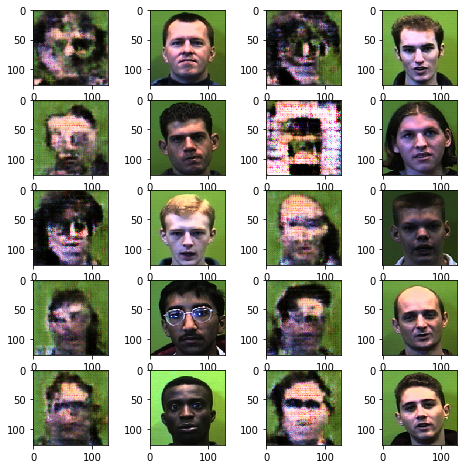

Epoch 12/50... Discriminator Loss: 0.3535... Generator Loss: 0.8216
Epoch 12/50... Discriminator Loss: 0.3510... Generator Loss: 0.8802
Epoch 12/50... Discriminator Loss: 0.7312... Generator Loss: 0.2705
Epoch 12/50... Discriminator Loss: 0.6316... Generator Loss: 0.7954
Epoch 12/50... Discriminator Loss: 0.6321... Generator Loss: 0.6792
Epoch 12/50... Discriminator Loss: 0.3878... Generator Loss: 0.8466
Epoch 12/50... Discriminator Loss: 0.4657... Generator Loss: 0.8663
Epoch 12/50... Discriminator Loss: 0.7955... Generator Loss: 0.8964
Epoch 12/50... Discriminator Loss: 0.4400... Generator Loss: 0.7408
Epoch 12/50... Discriminator Loss: 0.3564... Generator Loss: 0.7862
SAVING Checkpoint..
Epoch 13/50... Discriminator Loss: 0.4451... Generator Loss: 0.6845
Epoch 13/50... Discriminator Loss: 0.7914... Generator Loss: 0.6559
Epoch 13/50... Discriminator Loss: 0.4537... Generator Loss: 0.9447
Epoch 13/50... Discriminator Loss: 0.3498... Generator Loss: 0.8410
Epoch 13/50... Discriminator

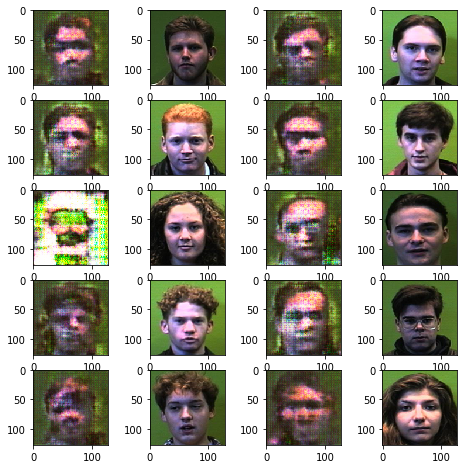

Epoch 13/50... Discriminator Loss: 0.4403... Generator Loss: 0.9307
Epoch 13/50... Discriminator Loss: 0.3931... Generator Loss: 0.8819
Epoch 13/50... Discriminator Loss: 0.3434... Generator Loss: 0.8515
Epoch 13/50... Discriminator Loss: 0.3462... Generator Loss: 0.8628
Epoch 13/50... Discriminator Loss: 0.3862... Generator Loss: 0.6782
Epoch 13/50... Discriminator Loss: 0.3929... Generator Loss: 0.9352
Epoch 13/50... Discriminator Loss: 0.3472... Generator Loss: 0.8706
Epoch 13/50... Discriminator Loss: 0.3722... Generator Loss: 0.9058
Epoch 13/50... Discriminator Loss: 0.3469... Generator Loss: 0.7985
SAVING Checkpoint..
Epoch 14/50... Discriminator Loss: 0.3379... Generator Loss: 0.7815
Epoch 14/50... Discriminator Loss: 0.3547... Generator Loss: 0.8991
Epoch 14/50... Discriminator Loss: 0.3638... Generator Loss: 0.8780
Epoch 14/50... Discriminator Loss: 0.3537... Generator Loss: 0.8774
Epoch 14/50... Discriminator Loss: 0.3418... Generator Loss: 0.8417
Epoch 14/50... Discriminator

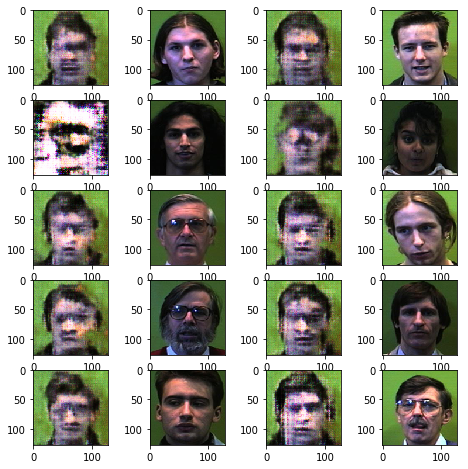

Epoch 14/50... Discriminator Loss: 0.3388... Generator Loss: 0.8076
Epoch 14/50... Discriminator Loss: 0.3384... Generator Loss: 0.7658
Epoch 14/50... Discriminator Loss: 0.3426... Generator Loss: 0.8446
Epoch 14/50... Discriminator Loss: 0.3426... Generator Loss: 0.8831
Epoch 14/50... Discriminator Loss: 0.3769... Generator Loss: 0.8248
Epoch 14/50... Discriminator Loss: 0.3457... Generator Loss: 0.8757
Epoch 14/50... Discriminator Loss: 0.7967... Generator Loss: 0.9474
Epoch 14/50... Discriminator Loss: 0.3424... Generator Loss: 0.8489
SAVING Checkpoint..
Epoch 15/50... Discriminator Loss: 0.3574... Generator Loss: 0.8932
Epoch 15/50... Discriminator Loss: 0.4172... Generator Loss: 0.6203
Epoch 15/50... Discriminator Loss: 0.3378... Generator Loss: 0.8303
Epoch 15/50... Discriminator Loss: 0.5103... Generator Loss: 0.9446
Epoch 15/50... Discriminator Loss: 0.4350... Generator Loss: 0.9128
Epoch 15/50... Discriminator Loss: 0.3525... Generator Loss: 0.8609
Epoch 15/50... Discriminator

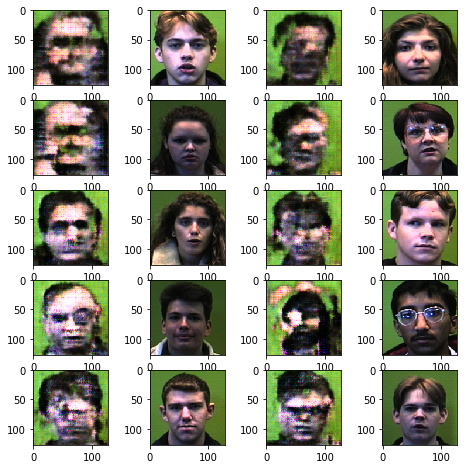

Epoch 15/50... Discriminator Loss: 0.3437... Generator Loss: 0.7822
Epoch 15/50... Discriminator Loss: 0.3404... Generator Loss: 0.8194
Epoch 15/50... Discriminator Loss: 0.3972... Generator Loss: 0.8845
Epoch 15/50... Discriminator Loss: 0.3410... Generator Loss: 0.8560
Epoch 15/50... Discriminator Loss: 0.3915... Generator Loss: 0.9298
Epoch 15/50... Discriminator Loss: 0.3951... Generator Loss: 0.9386
Epoch 15/50... Discriminator Loss: 0.3453... Generator Loss: 0.8724
Epoch 15/50... Discriminator Loss: 0.4932... Generator Loss: 0.5938
SAVING Checkpoint..
Epoch 16/50... Discriminator Loss: 0.3526... Generator Loss: 0.9003
Epoch 16/50... Discriminator Loss: 0.3392... Generator Loss: 0.8718
Epoch 16/50... Discriminator Loss: 0.3368... Generator Loss: 0.7869
Epoch 16/50... Discriminator Loss: 0.3635... Generator Loss: 0.9056
Epoch 16/50... Discriminator Loss: 0.3542... Generator Loss: 0.8879
Epoch 16/50... Discriminator Loss: 0.3621... Generator Loss: 0.7186
Epoch 16/50... Discriminator

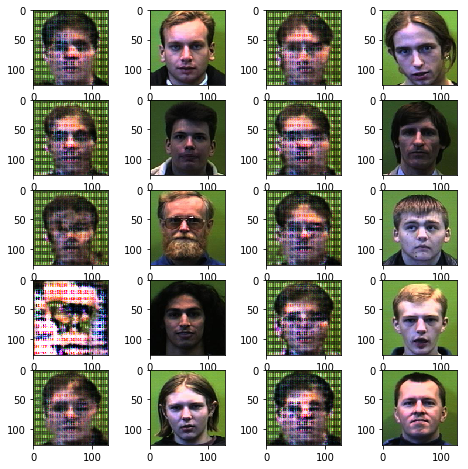

Epoch 16/50... Discriminator Loss: 0.3838... Generator Loss: 0.8805
Epoch 16/50... Discriminator Loss: 0.3422... Generator Loss: 0.8100
Epoch 16/50... Discriminator Loss: 0.3394... Generator Loss: 0.8271
Epoch 16/50... Discriminator Loss: 0.3919... Generator Loss: 0.9528
Epoch 16/50... Discriminator Loss: 0.3387... Generator Loss: 0.7817
Epoch 16/50... Discriminator Loss: 0.3513... Generator Loss: 0.9055
Epoch 16/50... Discriminator Loss: 0.3530... Generator Loss: 0.8759
SAVING Checkpoint..
Epoch 17/50... Discriminator Loss: 0.5108... Generator Loss: 0.9693
Epoch 17/50... Discriminator Loss: 0.3819... Generator Loss: 0.9516
Epoch 17/50... Discriminator Loss: 0.3343... Generator Loss: 0.8261
Epoch 17/50... Discriminator Loss: 0.4070... Generator Loss: 0.9682
Epoch 17/50... Discriminator Loss: 0.3371... Generator Loss: 0.8010
Epoch 17/50... Discriminator Loss: 0.3416... Generator Loss: 0.7518
Epoch 17/50... Discriminator Loss: 0.3315... Generator Loss: 0.8606
Epoch 17/50... Discriminator

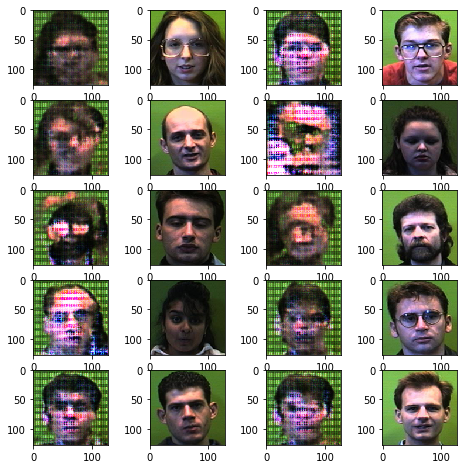

Epoch 17/50... Discriminator Loss: 0.3295... Generator Loss: 0.8230
Epoch 17/50... Discriminator Loss: 0.3279... Generator Loss: 0.8211
Epoch 17/50... Discriminator Loss: 0.3364... Generator Loss: 0.8485
Epoch 17/50... Discriminator Loss: 0.3339... Generator Loss: 0.8386
Epoch 17/50... Discriminator Loss: 0.3956... Generator Loss: 0.8219
Epoch 17/50... Discriminator Loss: 0.3703... Generator Loss: 0.6678
SAVING Checkpoint..
Epoch 18/50... Discriminator Loss: 0.6906... Generator Loss: 0.7535
Epoch 18/50... Discriminator Loss: 0.9538... Generator Loss: 0.3042
Epoch 18/50... Discriminator Loss: 0.5423... Generator Loss: 0.7801
Epoch 18/50... Discriminator Loss: 0.4090... Generator Loss: 0.8270
Epoch 18/50... Discriminator Loss: 0.4842... Generator Loss: 0.9046
Epoch 18/50... Discriminator Loss: 0.6361... Generator Loss: 0.9911
Epoch 18/50... Discriminator Loss: 0.4050... Generator Loss: 0.8293
Epoch 18/50... Discriminator Loss: 0.3714... Generator Loss: 0.8906
Epoch 18/50... Discriminator

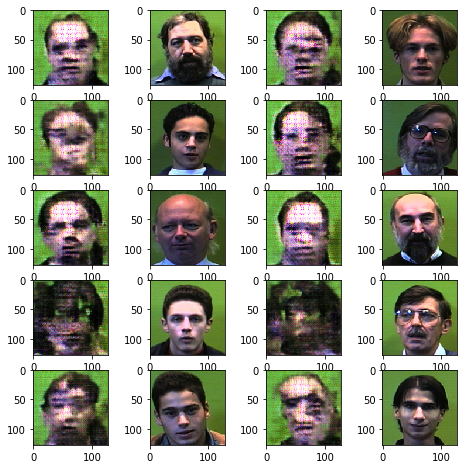

Epoch 18/50... Discriminator Loss: 0.6917... Generator Loss: 0.8619
Epoch 18/50... Discriminator Loss: 0.3589... Generator Loss: 0.8260
Epoch 18/50... Discriminator Loss: 0.3571... Generator Loss: 0.7587
Epoch 18/50... Discriminator Loss: 0.4551... Generator Loss: 0.9848
Epoch 18/50... Discriminator Loss: 0.3578... Generator Loss: 0.9191
SAVING Checkpoint..
Epoch 19/50... Discriminator Loss: 0.3482... Generator Loss: 0.8109
Epoch 19/50... Discriminator Loss: 0.3355... Generator Loss: 0.8369
Epoch 19/50... Discriminator Loss: 0.3560... Generator Loss: 0.8582
Epoch 19/50... Discriminator Loss: 0.3325... Generator Loss: 0.8015
Epoch 19/50... Discriminator Loss: 0.3410... Generator Loss: 0.8479
Epoch 19/50... Discriminator Loss: 0.3290... Generator Loss: 0.8095
Epoch 19/50... Discriminator Loss: 0.3412... Generator Loss: 0.7697
Epoch 19/50... Discriminator Loss: 0.3315... Generator Loss: 0.8312
Epoch 19/50... Discriminator Loss: 0.3330... Generator Loss: 0.8451
Epoch 19/50... Discriminator

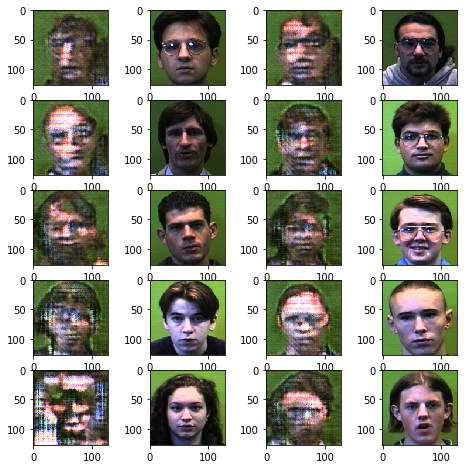

Epoch 19/50... Discriminator Loss: 0.3529... Generator Loss: 0.7075
Epoch 19/50... Discriminator Loss: 0.3700... Generator Loss: 0.9025
Epoch 19/50... Discriminator Loss: 0.3329... Generator Loss: 0.8205
Epoch 19/50... Discriminator Loss: 0.3697... Generator Loss: 0.9007
SAVING Checkpoint..
Epoch 20/50... Discriminator Loss: 2.4277... Generator Loss: 0.1651
Epoch 20/50... Discriminator Loss: 0.3821... Generator Loss: 0.8990
Epoch 20/50... Discriminator Loss: 1.6115... Generator Loss: 0.1520
Epoch 20/50... Discriminator Loss: 0.3887... Generator Loss: 0.9194
Epoch 20/50... Discriminator Loss: 0.3716... Generator Loss: 0.8204
Epoch 20/50... Discriminator Loss: 0.5269... Generator Loss: 0.9568
Epoch 20/50... Discriminator Loss: 0.3548... Generator Loss: 0.8488
Epoch 20/50... Discriminator Loss: 0.3756... Generator Loss: 0.8971
Epoch 20/50... Discriminator Loss: 0.3657... Generator Loss: 0.7900
Epoch 20/50... Discriminator Loss: 0.7272... Generator Loss: 0.7762
Epoch 20/50... Discriminator

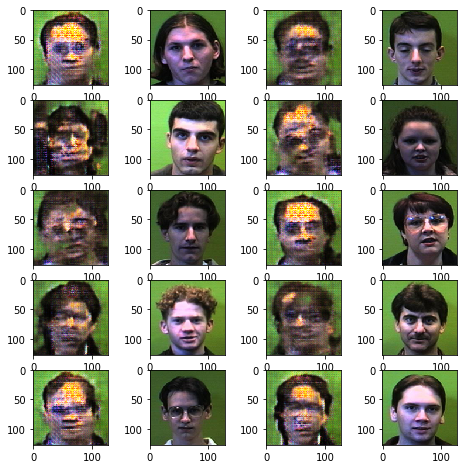

Epoch 20/50... Discriminator Loss: 0.3605... Generator Loss: 0.7053
Epoch 20/50... Discriminator Loss: 0.3911... Generator Loss: 0.6646
Epoch 20/50... Discriminator Loss: 0.5270... Generator Loss: 0.8237
Epoch 20/50... Discriminator Loss: 0.8366... Generator Loss: 0.9056
SAVING Checkpoint..
Epoch 21/50... Discriminator Loss: 0.4753... Generator Loss: 0.7770
Epoch 21/50... Discriminator Loss: 0.3517... Generator Loss: 0.7104
Epoch 21/50... Discriminator Loss: 0.3433... Generator Loss: 0.8981
Epoch 21/50... Discriminator Loss: 0.3517... Generator Loss: 0.7968
Epoch 21/50... Discriminator Loss: 0.3434... Generator Loss: 0.7793
Epoch 21/50... Discriminator Loss: 0.3414... Generator Loss: 0.7481
Epoch 21/50... Discriminator Loss: 0.3399... Generator Loss: 0.8535
Epoch 21/50... Discriminator Loss: 0.3711... Generator Loss: 0.8723
Epoch 21/50... Discriminator Loss: 0.4521... Generator Loss: 0.8581
Epoch 21/50... Discriminator Loss: 0.3951... Generator Loss: 0.9458
Epoch 21/50... Discriminator

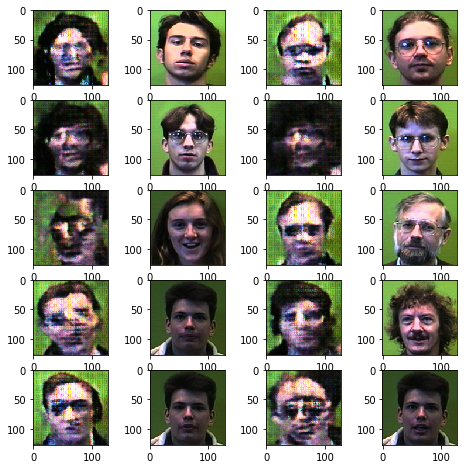

Epoch 21/50... Discriminator Loss: 0.3748... Generator Loss: 0.6792
Epoch 21/50... Discriminator Loss: 0.3736... Generator Loss: 0.8029
Epoch 21/50... Discriminator Loss: 0.3596... Generator Loss: 0.7997
SAVING Checkpoint..
Epoch 22/50... Discriminator Loss: 0.3435... Generator Loss: 0.8317
Epoch 22/50... Discriminator Loss: 0.4528... Generator Loss: 0.9639
Epoch 22/50... Discriminator Loss: 0.3489... Generator Loss: 0.7838
Epoch 22/50... Discriminator Loss: 0.3534... Generator Loss: 0.8605
Epoch 22/50... Discriminator Loss: 0.3696... Generator Loss: 0.7652
Epoch 22/50... Discriminator Loss: 0.4205... Generator Loss: 0.6089
Epoch 22/50... Discriminator Loss: 0.3564... Generator Loss: 0.7184
Epoch 22/50... Discriminator Loss: 0.3646... Generator Loss: 0.7256
Epoch 22/50... Discriminator Loss: 0.3816... Generator Loss: 0.8585
Epoch 22/50... Discriminator Loss: 0.3580... Generator Loss: 0.7830
Epoch 22/50... Discriminator Loss: 0.4548... Generator Loss: 0.5468
Epoch 22/50... Discriminator

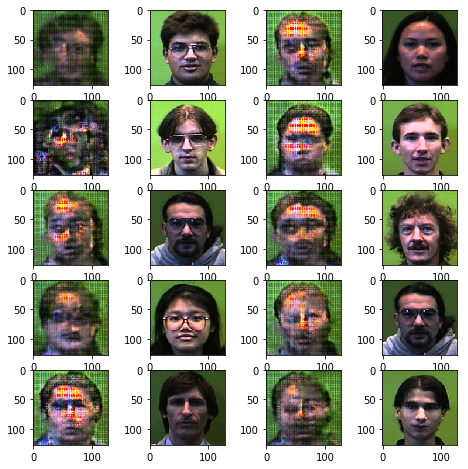

Epoch 22/50... Discriminator Loss: 0.3338... Generator Loss: 0.8386
Epoch 22/50... Discriminator Loss: 0.3523... Generator Loss: 0.8945
SAVING Checkpoint..
Epoch 23/50... Discriminator Loss: 0.3429... Generator Loss: 0.7622
Epoch 23/50... Discriminator Loss: 0.3331... Generator Loss: 0.7736
Epoch 23/50... Discriminator Loss: 0.3607... Generator Loss: 0.9270
Epoch 23/50... Discriminator Loss: 0.3554... Generator Loss: 0.9215
Epoch 23/50... Discriminator Loss: 0.3304... Generator Loss: 0.7888
Epoch 23/50... Discriminator Loss: 0.3336... Generator Loss: 0.7695
Epoch 23/50... Discriminator Loss: 0.3340... Generator Loss: 0.8524
Epoch 23/50... Discriminator Loss: 0.3325... Generator Loss: 0.7663
Epoch 23/50... Discriminator Loss: 0.3293... Generator Loss: 0.8147
Epoch 23/50... Discriminator Loss: 0.3298... Generator Loss: 0.8437
Epoch 23/50... Discriminator Loss: 0.3324... Generator Loss: 0.7650
Epoch 23/50... Discriminator Loss: 0.3729... Generator Loss: 0.9350
Epoch 23/50... Discriminator

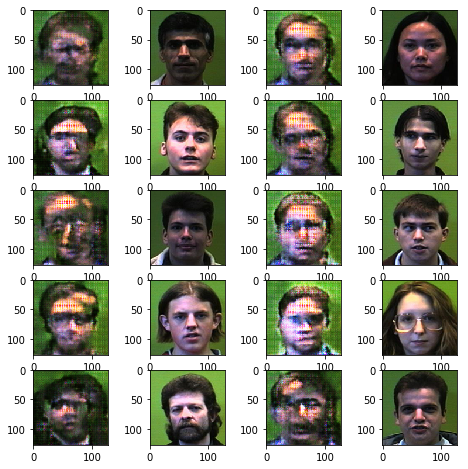

Epoch 23/50... Discriminator Loss: 0.3777... Generator Loss: 0.6567
SAVING Checkpoint..
Epoch 24/50... Discriminator Loss: 1.3548... Generator Loss: 0.3242
Epoch 24/50... Discriminator Loss: 1.6213... Generator Loss: 0.6712
Epoch 24/50... Discriminator Loss: 1.1357... Generator Loss: 0.3596
Epoch 24/50... Discriminator Loss: 0.4324... Generator Loss: 0.8455
Epoch 24/50... Discriminator Loss: 0.3712... Generator Loss: 0.7871
Epoch 24/50... Discriminator Loss: 0.3694... Generator Loss: 0.8212
Epoch 24/50... Discriminator Loss: 0.5517... Generator Loss: 0.8308
Epoch 24/50... Discriminator Loss: 0.3621... Generator Loss: 0.8028
Epoch 24/50... Discriminator Loss: 0.5432... Generator Loss: 0.9034
Epoch 24/50... Discriminator Loss: 0.3476... Generator Loss: 0.8097
Epoch 24/50... Discriminator Loss: 0.4097... Generator Loss: 0.8607
Epoch 24/50... Discriminator Loss: 0.8441... Generator Loss: 0.7835
Epoch 24/50... Discriminator Loss: 0.3869... Generator Loss: 0.6974
Epoch 24/50... Discriminator

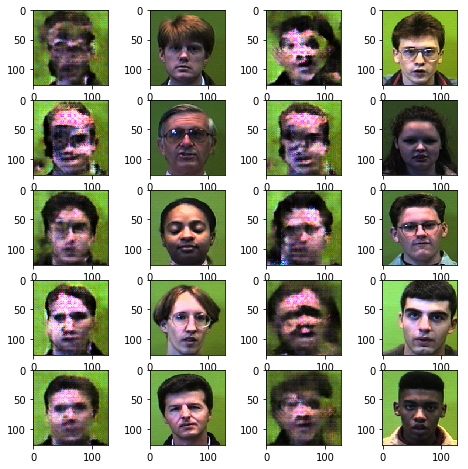

SAVING Checkpoint..
Epoch 25/50... Discriminator Loss: 0.3892... Generator Loss: 0.8845
Epoch 25/50... Discriminator Loss: 0.3457... Generator Loss: 0.8449
Epoch 25/50... Discriminator Loss: 0.3367... Generator Loss: 0.8593
Epoch 25/50... Discriminator Loss: 0.3361... Generator Loss: 0.8095
Epoch 25/50... Discriminator Loss: 0.3343... Generator Loss: 0.8219
Epoch 25/50... Discriminator Loss: 0.3428... Generator Loss: 0.8679
Epoch 25/50... Discriminator Loss: 0.3424... Generator Loss: 0.7886
Epoch 25/50... Discriminator Loss: 0.3501... Generator Loss: 0.7771
Epoch 25/50... Discriminator Loss: 0.3390... Generator Loss: 0.7869
Epoch 25/50... Discriminator Loss: 0.3356... Generator Loss: 0.8170
Epoch 25/50... Discriminator Loss: 0.3372... Generator Loss: 0.7947
Epoch 25/50... Discriminator Loss: 0.3461... Generator Loss: 0.8079
Epoch 25/50... Discriminator Loss: 0.3430... Generator Loss: 0.8152
Epoch 25/50... Discriminator Loss: 0.3492... Generator Loss: 0.7720
Epoch 25/50... Discriminator

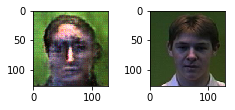

SAVING Checkpoint..
Epoch 26/50... Discriminator Loss: 0.3574... Generator Loss: 0.7388
Epoch 26/50... Discriminator Loss: 0.3822... Generator Loss: 0.9109
Epoch 26/50... Discriminator Loss: 0.3633... Generator Loss: 0.7799
Epoch 26/50... Discriminator Loss: 0.3574... Generator Loss: 0.8566
Epoch 26/50... Discriminator Loss: 0.3465... Generator Loss: 0.8381
Epoch 26/50... Discriminator Loss: 0.3785... Generator Loss: 0.8709
Epoch 26/50... Discriminator Loss: 0.3394... Generator Loss: 0.8419
Epoch 26/50... Discriminator Loss: 0.3847... Generator Loss: 0.6099
Epoch 26/50... Discriminator Loss: 0.3405... Generator Loss: 0.8082
Epoch 26/50... Discriminator Loss: 0.4188... Generator Loss: 0.9018
Epoch 26/50... Discriminator Loss: 0.3395... Generator Loss: 0.8193
Epoch 26/50... Discriminator Loss: 0.3315... Generator Loss: 0.7953
Epoch 26/50... Discriminator Loss: 0.3545... Generator Loss: 0.8886
Epoch 26/50... Discriminator Loss: 0.3675... Generator Loss: 0.8498
Epoch 26/50... Discriminator

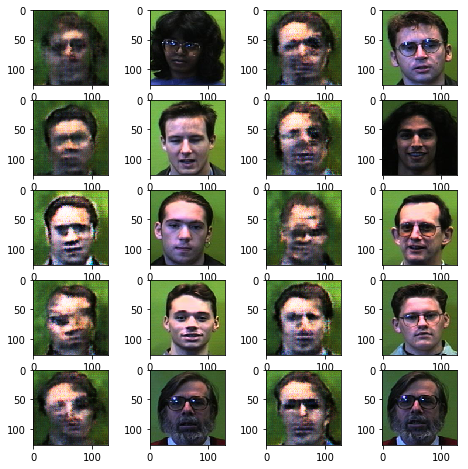

Epoch 27/50... Discriminator Loss: 0.3974... Generator Loss: 0.8958
Epoch 27/50... Discriminator Loss: 0.3818... Generator Loss: 0.9049
Epoch 27/50... Discriminator Loss: 0.3524... Generator Loss: 0.7024
Epoch 27/50... Discriminator Loss: 0.3503... Generator Loss: 0.8846
Epoch 27/50... Discriminator Loss: 0.3479... Generator Loss: 0.8079
Epoch 27/50... Discriminator Loss: 0.3502... Generator Loss: 0.7334
Epoch 27/50... Discriminator Loss: 0.3509... Generator Loss: 0.8601
Epoch 27/50... Discriminator Loss: 0.5390... Generator Loss: 0.9400
Epoch 27/50... Discriminator Loss: 0.3588... Generator Loss: 0.8465
Epoch 27/50... Discriminator Loss: 0.3401... Generator Loss: 0.8481
Epoch 27/50... Discriminator Loss: 0.3376... Generator Loss: 0.8035
Epoch 27/50... Discriminator Loss: 0.3336... Generator Loss: 0.8354
Epoch 27/50... Discriminator Loss: 0.3462... Generator Loss: 0.9039
Epoch 27/50... Discriminator Loss: 0.3294... Generator Loss: 0.8270
Epoch 27/50... Discriminator Loss: 0.3413... Gen

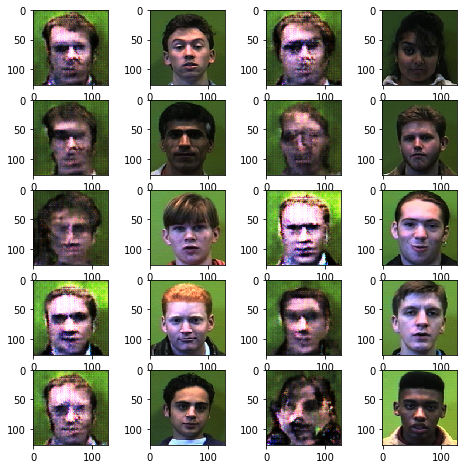

Epoch 28/50... Discriminator Loss: 0.4141... Generator Loss: 0.8980
Epoch 28/50... Discriminator Loss: 0.4077... Generator Loss: 0.7478
Epoch 28/50... Discriminator Loss: 0.6812... Generator Loss: 0.9138
Epoch 28/50... Discriminator Loss: 0.4969... Generator Loss: 0.9854
Epoch 28/50... Discriminator Loss: 0.5408... Generator Loss: 0.9898
Epoch 28/50... Discriminator Loss: 0.3590... Generator Loss: 0.8662
Epoch 28/50... Discriminator Loss: 0.3403... Generator Loss: 0.8826
Epoch 28/50... Discriminator Loss: 0.3415... Generator Loss: 0.8390
Epoch 28/50... Discriminator Loss: 0.3305... Generator Loss: 0.8222
Epoch 28/50... Discriminator Loss: 0.3398... Generator Loss: 0.7568
Epoch 28/50... Discriminator Loss: 0.3335... Generator Loss: 0.8430
Epoch 28/50... Discriminator Loss: 0.3356... Generator Loss: 0.8078
Epoch 28/50... Discriminator Loss: 0.3599... Generator Loss: 0.7074
Epoch 28/50... Discriminator Loss: 0.3679... Generator Loss: 0.7727
Epoch 28/50... Discriminator Loss: 0.3386... Gen

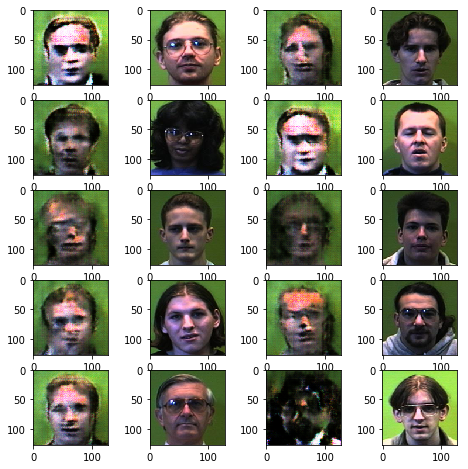

Epoch 29/50... Discriminator Loss: 0.3599... Generator Loss: 0.7922
Epoch 29/50... Discriminator Loss: 0.3855... Generator Loss: 0.8645
Epoch 29/50... Discriminator Loss: 0.3463... Generator Loss: 0.8085
Epoch 29/50... Discriminator Loss: 0.3590... Generator Loss: 0.8086
Epoch 29/50... Discriminator Loss: 0.3597... Generator Loss: 0.9243
Epoch 29/50... Discriminator Loss: 0.3532... Generator Loss: 0.9132
Epoch 29/50... Discriminator Loss: 0.3365... Generator Loss: 0.7544
Epoch 29/50... Discriminator Loss: 0.3487... Generator Loss: 0.8689
Epoch 29/50... Discriminator Loss: 0.3307... Generator Loss: 0.7857
Epoch 29/50... Discriminator Loss: 0.3473... Generator Loss: 0.7364
Epoch 29/50... Discriminator Loss: 0.3290... Generator Loss: 0.8151
Epoch 29/50... Discriminator Loss: 0.3351... Generator Loss: 0.7625
Epoch 29/50... Discriminator Loss: 0.3422... Generator Loss: 0.8727
Epoch 29/50... Discriminator Loss: 0.3323... Generator Loss: 0.8430
Epoch 29/50... Discriminator Loss: 0.3911... Gen

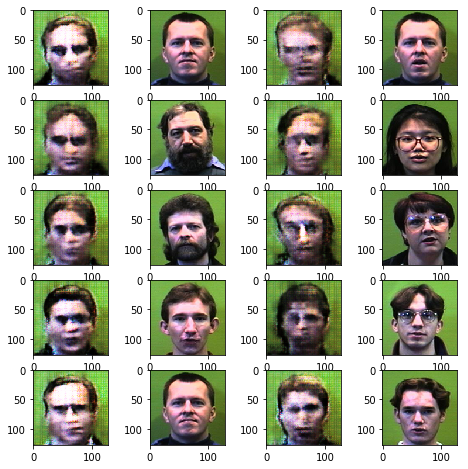

Epoch 30/50... Discriminator Loss: 0.3473... Generator Loss: 0.7496
Epoch 30/50... Discriminator Loss: 0.3422... Generator Loss: 0.7483
Epoch 30/50... Discriminator Loss: 0.3529... Generator Loss: 0.8200
Epoch 30/50... Discriminator Loss: 0.4973... Generator Loss: 0.8845
Epoch 30/50... Discriminator Loss: 0.3580... Generator Loss: 0.8582
Epoch 30/50... Discriminator Loss: 0.3486... Generator Loss: 0.7804
Epoch 30/50... Discriminator Loss: 0.3384... Generator Loss: 0.8537
Epoch 30/50... Discriminator Loss: 0.3542... Generator Loss: 0.9131
Epoch 30/50... Discriminator Loss: 0.4385... Generator Loss: 0.8540
Epoch 30/50... Discriminator Loss: 0.3589... Generator Loss: 0.7659
Epoch 30/50... Discriminator Loss: 0.3908... Generator Loss: 0.9308
Epoch 30/50... Discriminator Loss: 0.3632... Generator Loss: 0.9193
Epoch 30/50... Discriminator Loss: 0.3784... Generator Loss: 0.9436
Epoch 30/50... Discriminator Loss: 0.3319... Generator Loss: 0.8108
Epoch 30/50... Discriminator Loss: 0.3426... Gen

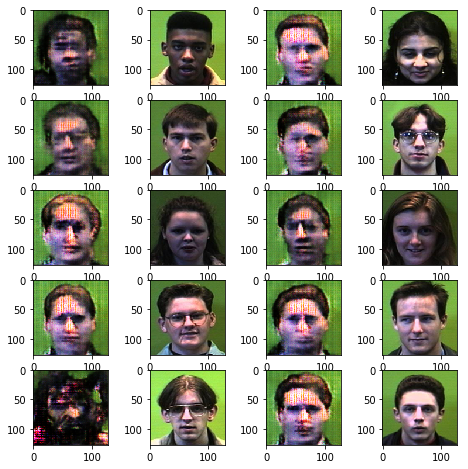

Epoch 31/50... Discriminator Loss: 0.3563... Generator Loss: 0.8965
Epoch 31/50... Discriminator Loss: 0.5138... Generator Loss: 0.7904
Epoch 31/50... Discriminator Loss: 0.4318... Generator Loss: 0.9655
Epoch 31/50... Discriminator Loss: 1.0156... Generator Loss: 0.2673
Epoch 31/50... Discriminator Loss: 0.3598... Generator Loss: 0.7805
Epoch 31/50... Discriminator Loss: 0.3701... Generator Loss: 0.9331
Epoch 31/50... Discriminator Loss: 0.4007... Generator Loss: 0.9492
Epoch 31/50... Discriminator Loss: 0.3649... Generator Loss: 0.8829
Epoch 31/50... Discriminator Loss: 0.3314... Generator Loss: 0.7857
Epoch 31/50... Discriminator Loss: 0.3703... Generator Loss: 0.7045
Epoch 31/50... Discriminator Loss: 0.3576... Generator Loss: 0.7346
Epoch 31/50... Discriminator Loss: 0.4042... Generator Loss: 0.9595
Epoch 31/50... Discriminator Loss: 0.3545... Generator Loss: 0.9153
Epoch 31/50... Discriminator Loss: 0.3323... Generator Loss: 0.7863
Epoch 31/50... Discriminator Loss: 0.3468... Gen

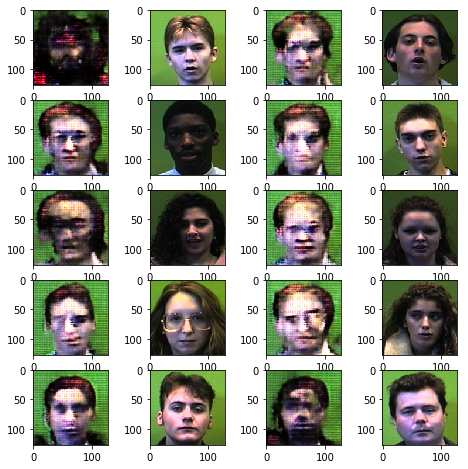

Epoch 32/50... Discriminator Loss: 0.3521... Generator Loss: 0.8473
Epoch 32/50... Discriminator Loss: 0.3362... Generator Loss: 0.7625
Epoch 32/50... Discriminator Loss: 0.3395... Generator Loss: 0.8803
Epoch 32/50... Discriminator Loss: 0.3325... Generator Loss: 0.7944
Epoch 32/50... Discriminator Loss: 0.3373... Generator Loss: 0.7482
Epoch 32/50... Discriminator Loss: 1.2635... Generator Loss: 0.8767
Epoch 32/50... Discriminator Loss: 0.3791... Generator Loss: 0.8306
Epoch 32/50... Discriminator Loss: 0.4015... Generator Loss: 0.9501
Epoch 32/50... Discriminator Loss: 0.3402... Generator Loss: 0.8709
Epoch 32/50... Discriminator Loss: 0.3704... Generator Loss: 0.9286
Epoch 32/50... Discriminator Loss: 0.3413... Generator Loss: 0.8403
Epoch 32/50... Discriminator Loss: 0.3329... Generator Loss: 0.7986
Epoch 32/50... Discriminator Loss: 0.3447... Generator Loss: 0.8450
Epoch 32/50... Discriminator Loss: 0.3296... Generator Loss: 0.7878
SAVING Checkpoint..
Epoch 33/50... Discriminator

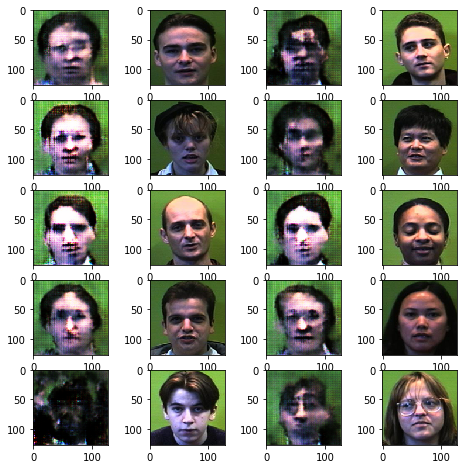

Epoch 33/50... Discriminator Loss: 0.3328... Generator Loss: 0.8082
Epoch 33/50... Discriminator Loss: 0.3399... Generator Loss: 0.8450
Epoch 33/50... Discriminator Loss: 0.3580... Generator Loss: 0.8522
Epoch 33/50... Discriminator Loss: 1.1600... Generator Loss: 0.2515
Epoch 33/50... Discriminator Loss: 0.5933... Generator Loss: 0.9875
Epoch 33/50... Discriminator Loss: 0.4496... Generator Loss: 0.8781
Epoch 33/50... Discriminator Loss: 0.4020... Generator Loss: 0.7687
Epoch 33/50... Discriminator Loss: 0.4058... Generator Loss: 0.6799
Epoch 33/50... Discriminator Loss: 0.7584... Generator Loss: 0.5299
Epoch 33/50... Discriminator Loss: 0.4136... Generator Loss: 0.8147
Epoch 33/50... Discriminator Loss: 0.3820... Generator Loss: 0.8613
Epoch 33/50... Discriminator Loss: 0.3828... Generator Loss: 0.8374
Epoch 33/50... Discriminator Loss: 0.6452... Generator Loss: 0.8594
SAVING Checkpoint..
Epoch 34/50... Discriminator Loss: 0.3499... Generator Loss: 0.8435
Epoch 34/50... Discriminator

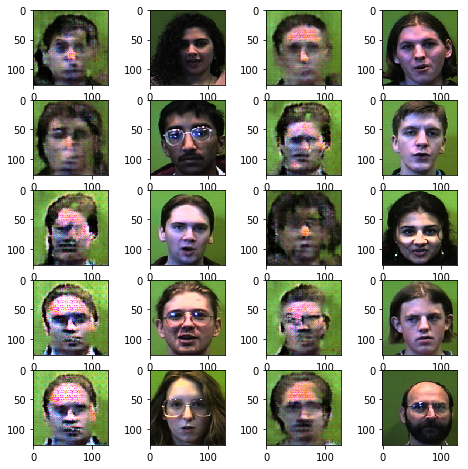

Epoch 34/50... Discriminator Loss: 0.3652... Generator Loss: 0.8096
Epoch 34/50... Discriminator Loss: 0.3664... Generator Loss: 0.8562
Epoch 34/50... Discriminator Loss: 0.3664... Generator Loss: 0.7218
Epoch 34/50... Discriminator Loss: 0.3523... Generator Loss: 0.7790
Epoch 34/50... Discriminator Loss: 0.3497... Generator Loss: 0.7642
Epoch 34/50... Discriminator Loss: 0.3654... Generator Loss: 0.6861
Epoch 34/50... Discriminator Loss: 0.3555... Generator Loss: 0.7839
Epoch 34/50... Discriminator Loss: 0.3531... Generator Loss: 0.7326
Epoch 34/50... Discriminator Loss: 0.3586... Generator Loss: 0.7274
Epoch 34/50... Discriminator Loss: 0.4791... Generator Loss: 0.9659
Epoch 34/50... Discriminator Loss: 0.3387... Generator Loss: 0.8623
Epoch 34/50... Discriminator Loss: 0.3481... Generator Loss: 0.8305
SAVING Checkpoint..
Epoch 35/50... Discriminator Loss: 0.3685... Generator Loss: 0.6544
Epoch 35/50... Discriminator Loss: 0.3407... Generator Loss: 0.8319
Epoch 35/50... Discriminator

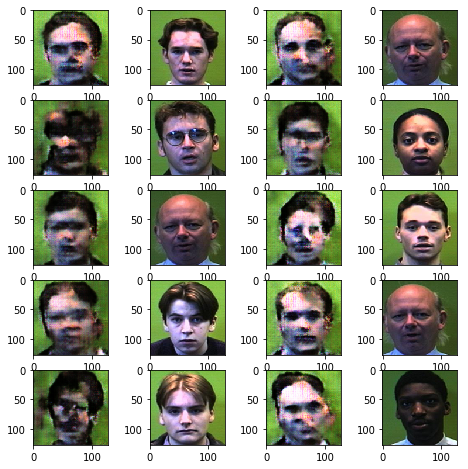

Epoch 35/50... Discriminator Loss: 0.3465... Generator Loss: 0.7708
Epoch 35/50... Discriminator Loss: 0.3442... Generator Loss: 0.7778
Epoch 35/50... Discriminator Loss: 0.3432... Generator Loss: 0.8020
Epoch 35/50... Discriminator Loss: 0.3660... Generator Loss: 0.8889
Epoch 35/50... Discriminator Loss: 0.3400... Generator Loss: 0.8479
Epoch 35/50... Discriminator Loss: 0.3442... Generator Loss: 0.7375
Epoch 35/50... Discriminator Loss: 0.3502... Generator Loss: 0.8242
Epoch 35/50... Discriminator Loss: 0.3393... Generator Loss: 0.7629
Epoch 35/50... Discriminator Loss: 0.3492... Generator Loss: 0.8042
Epoch 35/50... Discriminator Loss: 0.3538... Generator Loss: 0.7243
Epoch 35/50... Discriminator Loss: 0.3659... Generator Loss: 0.8901
Epoch 35/50... Discriminator Loss: 0.5726... Generator Loss: 0.6210
SAVING Checkpoint..
Epoch 36/50... Discriminator Loss: 0.3651... Generator Loss: 0.7713
Epoch 36/50... Discriminator Loss: 0.3618... Generator Loss: 0.7068
Epoch 36/50... Discriminator

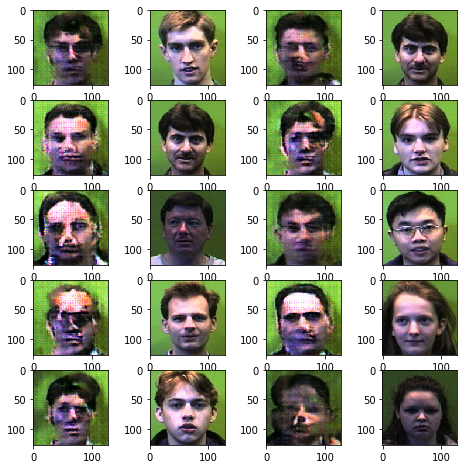

Epoch 36/50... Discriminator Loss: 0.3477... Generator Loss: 0.8338
Epoch 36/50... Discriminator Loss: 0.3463... Generator Loss: 0.7481
Epoch 36/50... Discriminator Loss: 0.3360... Generator Loss: 0.8057
Epoch 36/50... Discriminator Loss: 0.3398... Generator Loss: 0.7332
Epoch 36/50... Discriminator Loss: 0.3615... Generator Loss: 0.8945
Epoch 36/50... Discriminator Loss: 0.3448... Generator Loss: 0.7550
Epoch 36/50... Discriminator Loss: 0.3920... Generator Loss: 0.8935
Epoch 36/50... Discriminator Loss: 0.4198... Generator Loss: 0.9117
Epoch 36/50... Discriminator Loss: 0.3534... Generator Loss: 0.7289
Epoch 36/50... Discriminator Loss: 0.4297... Generator Loss: 0.7842
Epoch 36/50... Discriminator Loss: 0.6126... Generator Loss: 0.8737
SAVING Checkpoint..
Epoch 37/50... Discriminator Loss: 0.5530... Generator Loss: 0.9947
Epoch 37/50... Discriminator Loss: 0.5647... Generator Loss: 0.9848
Epoch 37/50... Discriminator Loss: 0.3639... Generator Loss: 0.7905
Epoch 37/50... Discriminator

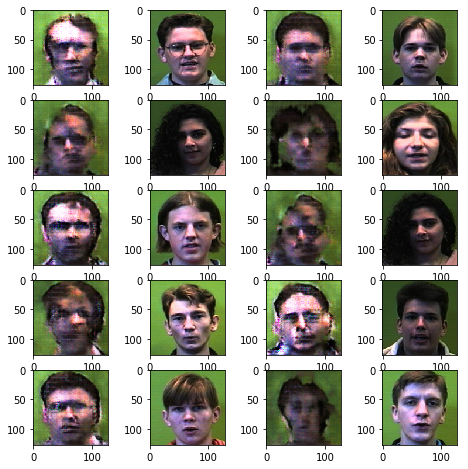

Epoch 37/50... Discriminator Loss: 0.3473... Generator Loss: 0.8256
Epoch 37/50... Discriminator Loss: 0.3724... Generator Loss: 0.8654
Epoch 37/50... Discriminator Loss: 0.3684... Generator Loss: 0.8675
Epoch 37/50... Discriminator Loss: 0.3449... Generator Loss: 0.8661
Epoch 37/50... Discriminator Loss: 0.3412... Generator Loss: 0.8026
Epoch 37/50... Discriminator Loss: 0.4550... Generator Loss: 0.5338
Epoch 37/50... Discriminator Loss: 0.3851... Generator Loss: 0.8656
Epoch 37/50... Discriminator Loss: 0.3424... Generator Loss: 0.8017
Epoch 37/50... Discriminator Loss: 0.3643... Generator Loss: 0.7780
Epoch 37/50... Discriminator Loss: 0.3340... Generator Loss: 0.8024
SAVING Checkpoint..
Epoch 38/50... Discriminator Loss: 0.3349... Generator Loss: 0.7836
Epoch 38/50... Discriminator Loss: 0.3360... Generator Loss: 0.7970
Epoch 38/50... Discriminator Loss: 0.3335... Generator Loss: 0.8060
Epoch 38/50... Discriminator Loss: 0.3458... Generator Loss: 0.7295
Epoch 38/50... Discriminator

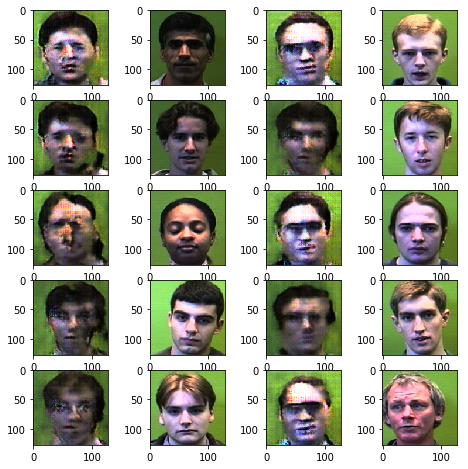

Epoch 38/50... Discriminator Loss: 0.6597... Generator Loss: 0.7872
Epoch 38/50... Discriminator Loss: 0.3482... Generator Loss: 0.7597
Epoch 38/50... Discriminator Loss: 0.3533... Generator Loss: 0.8066
Epoch 38/50... Discriminator Loss: 0.3724... Generator Loss: 0.9169
Epoch 38/50... Discriminator Loss: 0.3363... Generator Loss: 0.8441
Epoch 38/50... Discriminator Loss: 0.4412... Generator Loss: 0.9760
Epoch 38/50... Discriminator Loss: 0.3678... Generator Loss: 0.8218
Epoch 38/50... Discriminator Loss: 0.3333... Generator Loss: 0.8219
Epoch 38/50... Discriminator Loss: 0.3317... Generator Loss: 0.8357
SAVING Checkpoint..
Epoch 39/50... Discriminator Loss: 0.3378... Generator Loss: 0.8547
Epoch 39/50... Discriminator Loss: 0.3282... Generator Loss: 0.8197
Epoch 39/50... Discriminator Loss: 0.3302... Generator Loss: 0.8544
Epoch 39/50... Discriminator Loss: 0.3271... Generator Loss: 0.8003
Epoch 39/50... Discriminator Loss: 0.3972... Generator Loss: 0.9555
Epoch 39/50... Discriminator

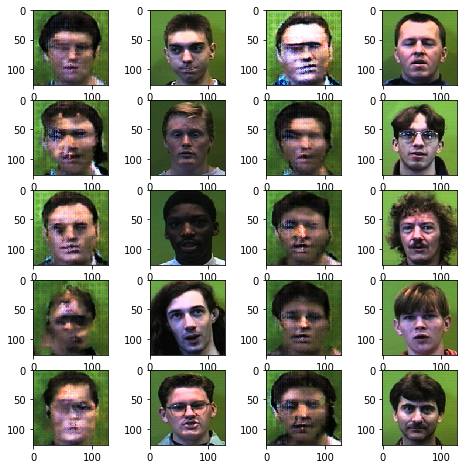

Epoch 39/50... Discriminator Loss: 0.3343... Generator Loss: 0.8624
Epoch 39/50... Discriminator Loss: 0.3327... Generator Loss: 0.7891
Epoch 39/50... Discriminator Loss: 0.3670... Generator Loss: 0.6790
Epoch 39/50... Discriminator Loss: 0.4310... Generator Loss: 0.9186
Epoch 39/50... Discriminator Loss: 0.3850... Generator Loss: 0.6372
Epoch 39/50... Discriminator Loss: 0.4549... Generator Loss: 0.5567
Epoch 39/50... Discriminator Loss: 0.4556... Generator Loss: 0.9770
Epoch 39/50... Discriminator Loss: 0.4224... Generator Loss: 0.8838
SAVING Checkpoint..
Epoch 40/50... Discriminator Loss: 0.4439... Generator Loss: 0.8196
Epoch 40/50... Discriminator Loss: 0.4288... Generator Loss: 0.8723
Epoch 40/50... Discriminator Loss: 0.3367... Generator Loss: 0.7762
Epoch 40/50... Discriminator Loss: 0.3706... Generator Loss: 0.7982
Epoch 40/50... Discriminator Loss: 0.3583... Generator Loss: 0.7612
Epoch 40/50... Discriminator Loss: 0.4535... Generator Loss: 0.9623
Epoch 40/50... Discriminator

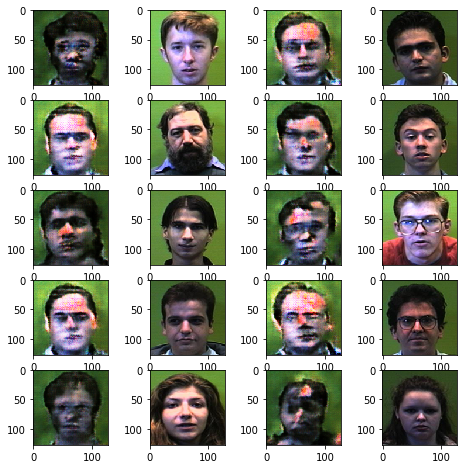

Epoch 40/50... Discriminator Loss: 0.3736... Generator Loss: 0.7063
Epoch 40/50... Discriminator Loss: 0.3687... Generator Loss: 0.8034
Epoch 40/50... Discriminator Loss: 0.3647... Generator Loss: 0.7953
Epoch 40/50... Discriminator Loss: 0.3718... Generator Loss: 0.8909
Epoch 40/50... Discriminator Loss: 0.3584... Generator Loss: 0.6944
Epoch 40/50... Discriminator Loss: 0.3711... Generator Loss: 0.8352
Epoch 40/50... Discriminator Loss: 0.3427... Generator Loss: 0.8032
Epoch 40/50... Discriminator Loss: 1.0647... Generator Loss: 0.1089
SAVING Checkpoint..
Epoch 41/50... Discriminator Loss: 0.3340... Generator Loss: 0.7715
Epoch 41/50... Discriminator Loss: 0.3693... Generator Loss: 0.8635
Epoch 41/50... Discriminator Loss: 0.3433... Generator Loss: 0.7960
Epoch 41/50... Discriminator Loss: 0.3452... Generator Loss: 0.7469
Epoch 41/50... Discriminator Loss: 0.3731... Generator Loss: 0.6911
Epoch 41/50... Discriminator Loss: 0.3507... Generator Loss: 0.8951
Epoch 41/50... Discriminator

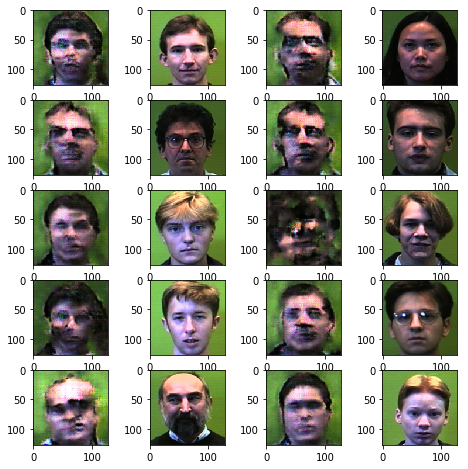

Epoch 41/50... Discriminator Loss: 0.3670... Generator Loss: 0.7357
Epoch 41/50... Discriminator Loss: 0.3698... Generator Loss: 0.8881
Epoch 41/50... Discriminator Loss: 0.3722... Generator Loss: 0.6890
Epoch 41/50... Discriminator Loss: 0.3438... Generator Loss: 0.8235
Epoch 41/50... Discriminator Loss: 0.3436... Generator Loss: 0.8076
Epoch 41/50... Discriminator Loss: 0.3489... Generator Loss: 0.8651
Epoch 41/50... Discriminator Loss: 0.3672... Generator Loss: 0.8924
SAVING Checkpoint..
Epoch 42/50... Discriminator Loss: 0.3641... Generator Loss: 0.8018
Epoch 42/50... Discriminator Loss: 0.4005... Generator Loss: 0.9088
Epoch 42/50... Discriminator Loss: 0.3340... Generator Loss: 0.8504
Epoch 42/50... Discriminator Loss: 0.3600... Generator Loss: 0.7111
Epoch 42/50... Discriminator Loss: 0.3542... Generator Loss: 0.8854
Epoch 42/50... Discriminator Loss: 0.3665... Generator Loss: 0.6718
Epoch 42/50... Discriminator Loss: 0.3482... Generator Loss: 0.7979
Epoch 42/50... Discriminator

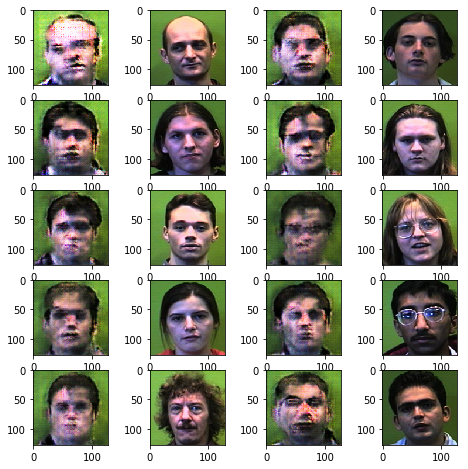

Epoch 42/50... Discriminator Loss: 0.3816... Generator Loss: 0.6658
Epoch 42/50... Discriminator Loss: 0.3603... Generator Loss: 0.8416
Epoch 42/50... Discriminator Loss: 0.3619... Generator Loss: 0.9007
Epoch 42/50... Discriminator Loss: 0.4331... Generator Loss: 0.9565
Epoch 42/50... Discriminator Loss: 0.3451... Generator Loss: 0.8021
Epoch 42/50... Discriminator Loss: 0.3346... Generator Loss: 0.7834
SAVING Checkpoint..
Epoch 43/50... Discriminator Loss: 0.3378... Generator Loss: 0.7864
Epoch 43/50... Discriminator Loss: 0.3460... Generator Loss: 0.7741
Epoch 43/50... Discriminator Loss: 0.3376... Generator Loss: 0.8480
Epoch 43/50... Discriminator Loss: 0.3323... Generator Loss: 0.7826
Epoch 43/50... Discriminator Loss: 0.3350... Generator Loss: 0.7756
Epoch 43/50... Discriminator Loss: 0.3354... Generator Loss: 0.8384
Epoch 43/50... Discriminator Loss: 0.3532... Generator Loss: 0.8103
Epoch 43/50... Discriminator Loss: 0.3640... Generator Loss: 0.7404
Epoch 43/50... Discriminator

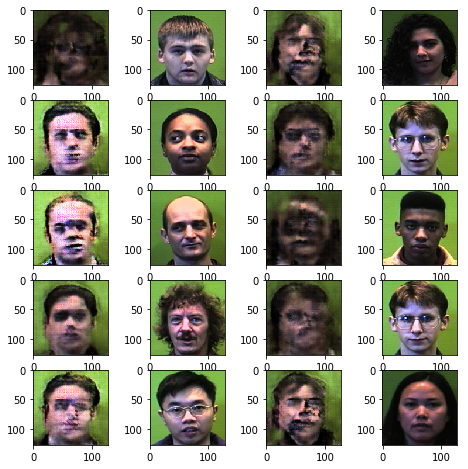

Epoch 43/50... Discriminator Loss: 0.4928... Generator Loss: 0.9522
Epoch 43/50... Discriminator Loss: 0.4849... Generator Loss: 0.8307
Epoch 43/50... Discriminator Loss: 1.1811... Generator Loss: 0.8302
Epoch 43/50... Discriminator Loss: 0.3937... Generator Loss: 0.7158
Epoch 43/50... Discriminator Loss: 0.3909... Generator Loss: 0.8614
SAVING Checkpoint..
Epoch 44/50... Discriminator Loss: 0.4827... Generator Loss: 0.9599
Epoch 44/50... Discriminator Loss: 0.4652... Generator Loss: 0.8508
Epoch 44/50... Discriminator Loss: 0.3962... Generator Loss: 0.7702
Epoch 44/50... Discriminator Loss: 0.3537... Generator Loss: 0.8563
Epoch 44/50... Discriminator Loss: 0.3442... Generator Loss: 0.8589
Epoch 44/50... Discriminator Loss: 0.3864... Generator Loss: 0.6542
Epoch 44/50... Discriminator Loss: 0.3532... Generator Loss: 0.7678
Epoch 44/50... Discriminator Loss: 0.7443... Generator Loss: 0.3225
Epoch 44/50... Discriminator Loss: 0.3647... Generator Loss: 0.9119
Epoch 44/50... Discriminator

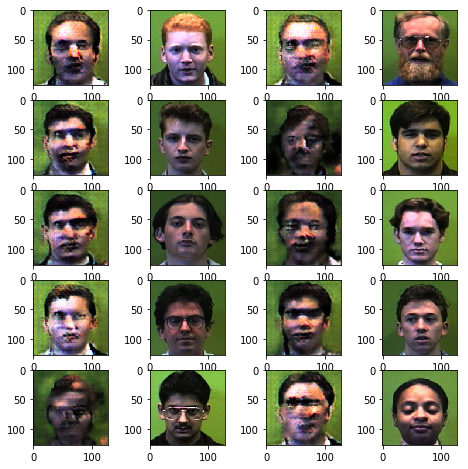

Epoch 44/50... Discriminator Loss: 0.4106... Generator Loss: 0.8972
Epoch 44/50... Discriminator Loss: 0.3931... Generator Loss: 0.8006
Epoch 44/50... Discriminator Loss: 0.3871... Generator Loss: 0.8545
Epoch 44/50... Discriminator Loss: 0.3552... Generator Loss: 0.8805
SAVING Checkpoint..
Epoch 45/50... Discriminator Loss: 0.3608... Generator Loss: 0.8424
Epoch 45/50... Discriminator Loss: 0.3558... Generator Loss: 0.7260
Epoch 45/50... Discriminator Loss: 0.3600... Generator Loss: 0.8873
Epoch 45/50... Discriminator Loss: 0.3346... Generator Loss: 0.8047
Epoch 45/50... Discriminator Loss: 0.3961... Generator Loss: 0.8673
Epoch 45/50... Discriminator Loss: 0.3429... Generator Loss: 0.8257
Epoch 45/50... Discriminator Loss: 0.3309... Generator Loss: 0.7941
Epoch 45/50... Discriminator Loss: 0.3737... Generator Loss: 0.9326
Epoch 45/50... Discriminator Loss: 0.3408... Generator Loss: 0.8391
Epoch 45/50... Discriminator Loss: 0.3361... Generator Loss: 0.7574
Epoch 45/50... Discriminator

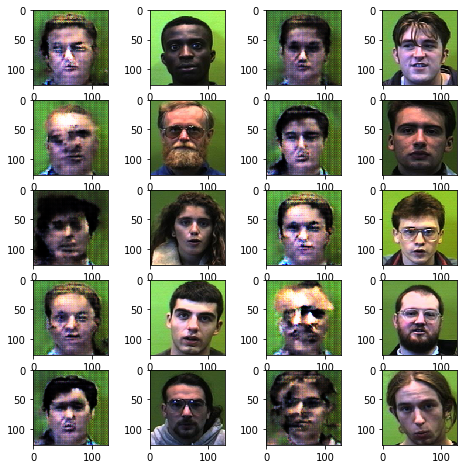

Epoch 45/50... Discriminator Loss: 0.3802... Generator Loss: 0.9371
Epoch 45/50... Discriminator Loss: 0.3500... Generator Loss: 0.7101
Epoch 45/50... Discriminator Loss: 0.3561... Generator Loss: 0.6909
Epoch 45/50... Discriminator Loss: 0.3431... Generator Loss: 0.7942
SAVING Checkpoint..
Epoch 46/50... Discriminator Loss: 0.3810... Generator Loss: 0.9057
Epoch 46/50... Discriminator Loss: 0.3492... Generator Loss: 0.7383
Epoch 46/50... Discriminator Loss: 0.3929... Generator Loss: 0.8883
Epoch 46/50... Discriminator Loss: 0.4499... Generator Loss: 0.8644
Epoch 46/50... Discriminator Loss: 0.3546... Generator Loss: 0.7780
Epoch 46/50... Discriminator Loss: 0.3478... Generator Loss: 0.8423
Epoch 46/50... Discriminator Loss: 0.3491... Generator Loss: 0.7072
Epoch 46/50... Discriminator Loss: 0.4005... Generator Loss: 0.9198
Epoch 46/50... Discriminator Loss: 0.4285... Generator Loss: 0.9537
Epoch 46/50... Discriminator Loss: 0.3779... Generator Loss: 0.7366
Epoch 46/50... Discriminator

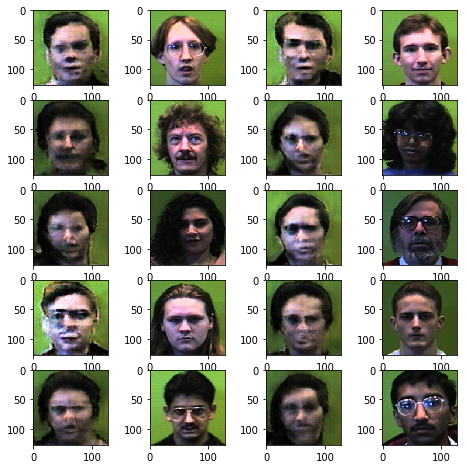

Epoch 46/50... Discriminator Loss: 0.3366... Generator Loss: 0.7402
Epoch 46/50... Discriminator Loss: 0.3983... Generator Loss: 0.7179
Epoch 46/50... Discriminator Loss: 0.3478... Generator Loss: 0.8912
SAVING Checkpoint..
Epoch 47/50... Discriminator Loss: 0.3406... Generator Loss: 0.8685
Epoch 47/50... Discriminator Loss: 0.3591... Generator Loss: 0.9171
Epoch 47/50... Discriminator Loss: 0.3337... Generator Loss: 0.7748
Epoch 47/50... Discriminator Loss: 0.3440... Generator Loss: 0.8851
Epoch 47/50... Discriminator Loss: 0.3546... Generator Loss: 0.8568
Epoch 47/50... Discriminator Loss: 0.3346... Generator Loss: 0.8564
Epoch 47/50... Discriminator Loss: 0.3327... Generator Loss: 0.7740
Epoch 47/50... Discriminator Loss: 0.3435... Generator Loss: 0.8182
Epoch 47/50... Discriminator Loss: 0.3413... Generator Loss: 0.7539
Epoch 47/50... Discriminator Loss: 0.4104... Generator Loss: 0.9595
Epoch 47/50... Discriminator Loss: 0.3405... Generator Loss: 0.8843
Epoch 47/50... Discriminator

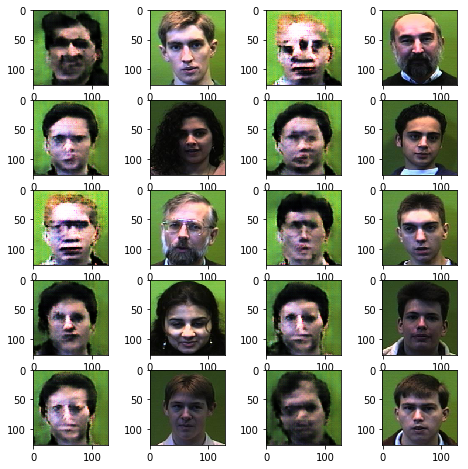

Epoch 47/50... Discriminator Loss: 0.3427... Generator Loss: 0.8399
Epoch 47/50... Discriminator Loss: 0.3786... Generator Loss: 0.8661
SAVING Checkpoint..
Epoch 48/50... Discriminator Loss: 0.3535... Generator Loss: 0.7374
Epoch 48/50... Discriminator Loss: 0.3367... Generator Loss: 0.8444
Epoch 48/50... Discriminator Loss: 0.3479... Generator Loss: 0.8460
Epoch 48/50... Discriminator Loss: 0.3356... Generator Loss: 0.8741
Epoch 48/50... Discriminator Loss: 0.3312... Generator Loss: 0.8252
Epoch 48/50... Discriminator Loss: 0.3317... Generator Loss: 0.7715
Epoch 48/50... Discriminator Loss: 0.3333... Generator Loss: 0.8706
Epoch 48/50... Discriminator Loss: 0.3363... Generator Loss: 0.8090
Epoch 48/50... Discriminator Loss: 0.3702... Generator Loss: 0.9325
Epoch 48/50... Discriminator Loss: 0.3284... Generator Loss: 0.8321
Epoch 48/50... Discriminator Loss: 0.3311... Generator Loss: 0.8361
Epoch 48/50... Discriminator Loss: 0.3300... Generator Loss: 0.8238
Epoch 48/50... Discriminator

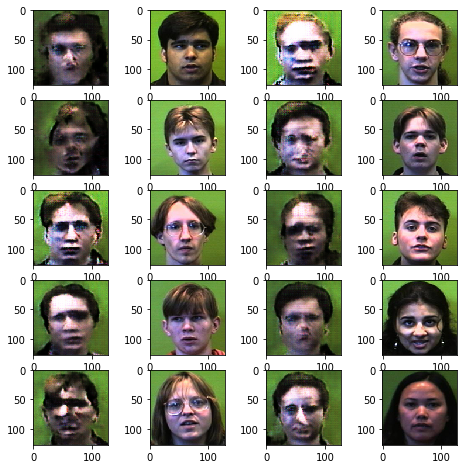

Epoch 48/50... Discriminator Loss: 0.5862... Generator Loss: 0.9450
SAVING Checkpoint..
Epoch 49/50... Discriminator Loss: 0.3568... Generator Loss: 0.8411
Epoch 49/50... Discriminator Loss: 0.3410... Generator Loss: 0.7894
Epoch 49/50... Discriminator Loss: 0.3540... Generator Loss: 0.7372
Epoch 49/50... Discriminator Loss: 0.3497... Generator Loss: 0.8434
Epoch 49/50... Discriminator Loss: 0.3878... Generator Loss: 0.6267
Epoch 49/50... Discriminator Loss: 0.4045... Generator Loss: 0.8497
Epoch 49/50... Discriminator Loss: 0.3522... Generator Loss: 0.7602
Epoch 49/50... Discriminator Loss: 0.3453... Generator Loss: 0.7320
Epoch 49/50... Discriminator Loss: 0.3775... Generator Loss: 0.8757
Epoch 49/50... Discriminator Loss: 0.3380... Generator Loss: 0.8159
Epoch 49/50... Discriminator Loss: 0.3582... Generator Loss: 0.6808
Epoch 49/50... Discriminator Loss: 0.3439... Generator Loss: 0.8403
Epoch 49/50... Discriminator Loss: 0.3359... Generator Loss: 0.7592
Epoch 49/50... Discriminator

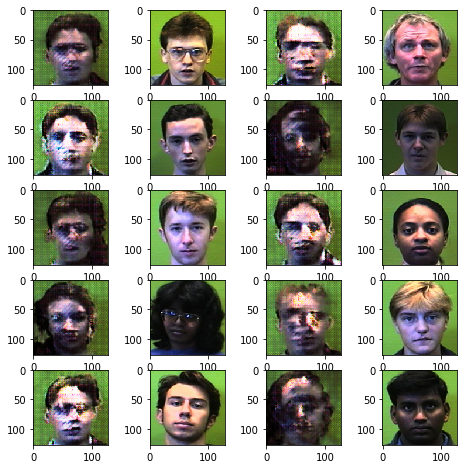

SAVING Checkpoint..
Epoch 50/50... Discriminator Loss: 0.4441... Generator Loss: 0.9706
Epoch 50/50... Discriminator Loss: 0.3415... Generator Loss: 0.8523
Epoch 50/50... Discriminator Loss: 0.3413... Generator Loss: 0.8536
Epoch 50/50... Discriminator Loss: 0.3356... Generator Loss: 0.7600
Epoch 50/50... Discriminator Loss: 0.4285... Generator Loss: 0.9693
Epoch 50/50... Discriminator Loss: 0.3333... Generator Loss: 0.7988
Epoch 50/50... Discriminator Loss: 0.3356... Generator Loss: 0.7894
Epoch 50/50... Discriminator Loss: 0.3308... Generator Loss: 0.8189
Epoch 50/50... Discriminator Loss: 0.3394... Generator Loss: 0.8466
Epoch 50/50... Discriminator Loss: 0.5382... Generator Loss: 0.8921
Epoch 50/50... Discriminator Loss: 0.4173... Generator Loss: 0.9473
Epoch 50/50... Discriminator Loss: 0.3340... Generator Loss: 0.7794
Epoch 50/50... Discriminator Loss: 0.3297... Generator Loss: 0.8206
Epoch 50/50... Discriminator Loss: 0.3999... Generator Loss: 0.5832
Epoch 50/50... Discriminator

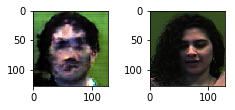

SAVING Checkpoint..


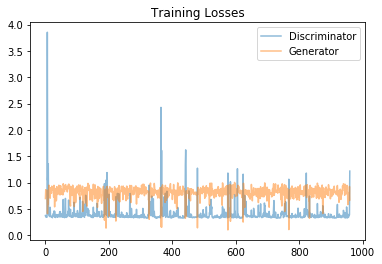

In [0]:
real_size = (128,128,3)
img_size = (128,128,3)
learning_rate_d = 0.0002
learning_rate_g = 0.0003
batch_size = 16
epochs = 50
alpha = 0.2
beta1 = 0.5

# Create the network
# net = GAN(real_size, z_size, learning_rate_d, learning_rate_g, alpha=alpha, beta1=beta1)
tf.reset_default_graph()
net1 = GAN()

losses, samples = train(net1, scaled_images, epochs, batch_size, figsize=(4,4))

fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()